In [1]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')
from imblearn.over_sampling import SMOTE
%matplotlib inline

## Step 1: Reading and Understanding the Data

In [2]:
# Read the dataset
teldf = pd.read_csv("telecom_churn_data.csv")

In [3]:
teldf.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,...,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,...,0,NaN,1.0,1.0,NaN,1006,0.0,0.0,0.00,0.00
2,7001625959,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,167.690,...,0,NaN,NaN,NaN,1.0,1103,0.0,0.0,4.17,0.00
3,7001204172,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,221.338,...,0,NaN,NaN,NaN,NaN,2491,0.0,0.0,0.00,0.00
4,7000142493,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,261.636,...,0,0.0,NaN,NaN,NaN,1526,0.0,0.0,0.00,0.00


##### Understand the data Set

In [4]:
print(teldf.columns)

Index(['mobile_number', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou',
       'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7',
       'last_date_of_month_8', 'last_date_of_month_9', 'arpu_6',
       ...
       'sachet_3g_9', 'fb_user_6', 'fb_user_7', 'fb_user_8', 'fb_user_9',
       'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g', 'sep_vbc_3g'],
      dtype='object', length=226)


In [5]:
# get the shape of the dataset
teldf.shape

(99999, 226)

In [6]:
teldf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


In [7]:
teldf.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
mobile_number,99999.0,7.001207e+09,695669.386290,7.000000e+09,7.000606e+09,7.001205e+09,7.001812e+09,7.002411e+09
circle_id,99999.0,1.090000e+02,0.000000,1.090000e+02,1.090000e+02,1.090000e+02,1.090000e+02,1.090000e+02
loc_og_t2o_mou,98981.0,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
std_og_t2o_mou,98981.0,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
loc_ic_t2o_mou,98981.0,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
arpu_6,99999.0,2.829874e+02,328.439770,-2.258709e+03,9.341150e+01,1.977040e+02,3.710600e+02,2.773109e+04
arpu_7,99999.0,2.785366e+02,338.156291,-2.014045e+03,8.698050e+01,1.916400e+02,3.653445e+02,3.514583e+04
arpu_8,99999.0,2.791547e+02,344.474791,-9.458080e+02,8.412600e+01,1.920800e+02,3.693705e+02,3.354362e+04
arpu_9,99999.0,2.616451e+02,341.998630,-1.899505e+03,6.268500e+01,1.768490e+02,3.534665e+02,3.880562e+04
onnet_mou_6,96062.0,1.323959e+02,297.207406,0.000000e+00,7.380000e+00,3.431000e+01,1.187400e+02,7.376710e+03


## Extract high value customers 
define new column 'seventyPercentile_avg_call' which holds 70% of average recharge amount in the first two months (6 and 7 months)

In [8]:
teldf['seventyPercentile_avg_call'] = (((teldf['total_rech_amt_6'] + teldf['total_rech_amt_7'])/2) *70)/100

In [9]:
rslt_tel_df = teldf[(teldf['total_rech_amt_6'] >= teldf['seventyPercentile_avg_call']) &
                (teldf['total_rech_amt_7'] >= teldf['seventyPercentile_avg_call']) &
                (teldf['total_rech_amt_8'] >= teldf['seventyPercentile_avg_call']) & 
                (teldf['total_rech_amt_9'] >= teldf['seventyPercentile_avg_call']) ]

#### drop the column 'seventyPercentile_avg_call'

In [10]:
rslt_tel_df = rslt_tel_df.drop(['seventyPercentile_avg_call'],axis=1)

In [11]:
rslt_tel_df.shape

(31345, 226)

### EDA
#### Data cleaning part

In [12]:
for col in rslt_tel_df.columns:
    print(col)

mobile_number
circle_id
loc_og_t2o_mou
std_og_t2o_mou
loc_ic_t2o_mou
last_date_of_month_6
last_date_of_month_7
last_date_of_month_8
last_date_of_month_9
arpu_6
arpu_7
arpu_8
arpu_9
onnet_mou_6
onnet_mou_7
onnet_mou_8
onnet_mou_9
offnet_mou_6
offnet_mou_7
offnet_mou_8
offnet_mou_9
roam_ic_mou_6
roam_ic_mou_7
roam_ic_mou_8
roam_ic_mou_9
roam_og_mou_6
roam_og_mou_7
roam_og_mou_8
roam_og_mou_9
loc_og_t2t_mou_6
loc_og_t2t_mou_7
loc_og_t2t_mou_8
loc_og_t2t_mou_9
loc_og_t2m_mou_6
loc_og_t2m_mou_7
loc_og_t2m_mou_8
loc_og_t2m_mou_9
loc_og_t2f_mou_6
loc_og_t2f_mou_7
loc_og_t2f_mou_8
loc_og_t2f_mou_9
loc_og_t2c_mou_6
loc_og_t2c_mou_7
loc_og_t2c_mou_8
loc_og_t2c_mou_9
loc_og_mou_6
loc_og_mou_7
loc_og_mou_8
loc_og_mou_9
std_og_t2t_mou_6
std_og_t2t_mou_7
std_og_t2t_mou_8
std_og_t2t_mou_9
std_og_t2m_mou_6
std_og_t2m_mou_7
std_og_t2m_mou_8
std_og_t2m_mou_9
std_og_t2f_mou_6
std_og_t2f_mou_7
std_og_t2f_mou_8
std_og_t2f_mou_9
std_og_t2c_mou_6
std_og_t2c_mou_7
std_og_t2c_mou_8
std_og_t2c_mou_9
std_og_mou_

In [13]:
# check if  any row has all the column null values , remove those rows
rslt_tel_df.isnull().all(axis=1).sum()

0

None of the rows has with all null values 

In [14]:
# find the % of missing values in each column
round(100 * (rslt_tel_df.isnull().sum()/len(rslt_tel_df.index)),2)

mobile_number            0.00
circle_id                0.00
loc_og_t2o_mou           1.01
std_og_t2o_mou           1.01
loc_ic_t2o_mou           1.01
last_date_of_month_6     0.00
last_date_of_month_7     0.46
last_date_of_month_8     0.37
last_date_of_month_9     0.63
arpu_6                   0.00
arpu_7                   0.00
arpu_8                   0.00
arpu_9                   0.00
onnet_mou_6              4.05
onnet_mou_7              4.05
onnet_mou_8              1.74
onnet_mou_9              2.26
offnet_mou_6             4.05
offnet_mou_7             4.05
offnet_mou_8             1.74
offnet_mou_9             2.26
roam_ic_mou_6            4.05
roam_ic_mou_7            4.05
roam_ic_mou_8            1.74
roam_ic_mou_9            2.26
roam_og_mou_6            4.05
roam_og_mou_7            4.05
roam_og_mou_8            1.74
roam_og_mou_9            2.26
loc_og_t2t_mou_6         4.05
                        ...  
arpu_2g_9               65.35
night_pck_user_6        72.60
night_pck_

### Remove columns which has only one unique value

In [15]:
print(rslt_tel_df.circle_id.unique())
print(rslt_tel_df.loc_og_t2o_mou.unique())
print(rslt_tel_df.std_og_t2o_mou.unique())
print(rslt_tel_df.loc_ic_t2o_mou.unique())
print(rslt_tel_df.last_date_of_month_6.unique())
print(rslt_tel_df.last_date_of_month_7.unique())
print(rslt_tel_df.last_date_of_month_8.unique())
print(rslt_tel_df.last_date_of_month_9.unique())

[109]
[ 0. nan]
[ 0. nan]
[ 0. nan]
['6/30/2014']
['7/31/2014' nan]
['8/31/2014' nan]
['9/30/2014' nan]


 #### columns circle_id, loc_og_t2o_mou, std_og_t2o_mou, loc_ic_t2o_mou, last_date_of_month_6,last_date_of_month_7, last_date_of_month_8,and last_date_of_month_9  , has only one unique values , so it is better to drop them ,  as it is of no importance.

In [16]:
rslt_tel_df = rslt_tel_df.drop(['circle_id','loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou','last_date_of_month_6','last_date_of_month_7','last_date_of_month_8','last_date_of_month_9'],axis=1)

#### Find column who has more than 50% null values

In [17]:
# find the columns who has more then 50% null values
print((rslt_tel_df.columns[rslt_tel_df.apply(lambda col: col.isnull().sum()/len(rslt_tel_df) > 0.65)]))

Index(['date_of_last_rech_data_6', 'date_of_last_rech_data_7',
       'date_of_last_rech_data_8', 'date_of_last_rech_data_9',
       'total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8',
       'total_rech_data_9', 'max_rech_data_6', 'max_rech_data_7',
       'max_rech_data_8', 'max_rech_data_9', 'count_rech_2g_6',
       'count_rech_2g_7', 'count_rech_2g_8', 'count_rech_2g_9',
       'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8',
       'count_rech_3g_9', 'av_rech_amt_data_6', 'av_rech_amt_data_7',
       'av_rech_amt_data_8', 'av_rech_amt_data_9', 'arpu_3g_6', 'arpu_3g_7',
       'arpu_3g_8', 'arpu_3g_9', 'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8',
       'arpu_2g_9', 'night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8',
       'night_pck_user_9', 'fb_user_6', 'fb_user_7', 'fb_user_8', 'fb_user_9'],
      dtype='object')


In [18]:
print(len((rslt_tel_df.columns[rslt_tel_df.apply(lambda col: col.isnull().sum()/len(rslt_tel_df) > 0.65)])))

40


#### Look the spread of data of these columns who has more then 65% null values

In [19]:
dummydf = rslt_tel_df[['date_of_last_rech_data_6', 'date_of_last_rech_data_7',
       'date_of_last_rech_data_8', 'date_of_last_rech_data_9',
       'total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8',
       'total_rech_data_9', 'max_rech_data_6', 'max_rech_data_7',
       'max_rech_data_8', 'max_rech_data_9', 'count_rech_2g_6',
       'count_rech_2g_7', 'count_rech_2g_8', 'count_rech_2g_9',
       'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8',
       'count_rech_3g_9', 'av_rech_amt_data_6', 'av_rech_amt_data_7',
       'av_rech_amt_data_8', 'av_rech_amt_data_9', 'arpu_3g_6', 'arpu_3g_7',
       'arpu_3g_8', 'arpu_3g_9', 'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8',
       'arpu_2g_9', 'night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8',
       'night_pck_user_9', 'fb_user_6', 'fb_user_7', 'fb_user_8', 'fb_user_9']]

### Checking outliers at 25%, 50%, 75%, 90%, 95% and 99%

In [20]:
# Checking outliers at 25%, 50%, 75%, 90%, 95% and 99%

dummydf.describe(percentiles=[.25, .5, .75, .90, .95, .99]).transpose()

,count,mean,std,min,25%,50%,75%,90%,95%,99%,max
total_rech_data_6,8588.0,2.522823,2.909459,1.00,1.00,1.00,3.0000,6.000,9.0000,14.0000,61.00
total_rech_data_7,8853.0,2.732972,3.056531,1.00,1.00,1.00,3.0000,6.000,9.0000,14.0000,50.00
total_rech_data_8,10565.0,2.818741,3.226727,1.00,1.00,2.00,3.0000,6.000,9.0000,14.0000,60.00
total_rech_data_9,10861.0,2.597459,2.756711,1.00,1.00,2.00,3.0000,6.000,8.0000,12.0000,84.00
max_rech_data_6,8588.0,125.223335,103.990829,1.00,25.00,149.00,154.0000,252.000,252.0000,455.0000,1555.00
max_rech_data_7,8853.0,125.553485,104.569458,1.00,25.00,152.00,154.0000,252.000,252.0000,455.0000,1555.00
max_rech_data_8,10565.0,129.995551,107.653114,1.00,25.00,152.00,179.0000,252.000,252.0000,455.0000,1555.00
max_rech_data_9,10861.0,129.483657,109.296952,1.00,25.00,149.00,179.0000,252.000,252.0000,455.0000,1555.00
count_rech_2g_6,8588.0,1.963204,2.702008,0.00,1.00,1.00,2.0000,5.000,8.0000,12.0000,32.00
count_rech_2g_7,8853.0,2.162883,2.886760,0.00,1.00,1.00,2.0000,6.000,8.0000,13.0000,27.00


#### if we look data of the describe() , the difference between max and 75% of data is too much , i feel that outliers are more, and std is also small, so these column does not play important role.
#### since our focus is on telecom network usage, telecom network usage data gives much more info , columns such as total_og_mou, total_ic_moc , vol_2g_mb, vol_3g_mb . Above null columns does not reflect much info on usage of the network , so dropping these column does not impact much.

In [21]:
#drop all columns who has more then 65% of null values
rslt_tel_df = rslt_tel_df.drop(rslt_tel_df.columns[rslt_tel_df.apply(lambda col: col.isnull().sum()/len(rslt_tel_df) > 0.65)], axis=1)

In [22]:
rslt_tel_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 31345 entries, 3 to 99997
Columns: 178 entries, mobile_number to sep_vbc_3g
dtypes: float64(140), int64(34), object(4)
memory usage: 42.8+ MB


In [23]:
# check the null values in each rows.
rslt_tel_df.isnull().sum(axis =1 )

3          0
4          0
9          0
10        29
12         0
14         0
20         0
21         0
24         0
36         0
38         0
39         0
42         0
43         0
44         0
46         0
60         0
68        59
70         0
71         0
74         0
75         0
76         0
82         0
87         0
92         0
93         0
101        0
104        0
105        0
        ... 
99886      0
99889      0
99892      0
99897      0
99902      0
99906      0
99907      0
99913      0
99916      0
99917      0
99929      0
99930      0
99933     29
99937      0
99938      0
99950      0
99952      0
99953      0
99954      0
99956      0
99963      0
99966      0
99970      0
99972      0
99974      0
99976      0
99978    118
99988      0
99993    119
99997      0
Length: 31345, dtype: int64

In [24]:
#calculate the percentage of missing values whose number of missing values is > 5
100 * (len(rslt_tel_df[rslt_tel_df.isnull().sum(axis =1) > 5].index)/len(rslt_tel_df.index))

5.685117243579518

So  5.5% of data ,have null values with rows greater than 5 columns, so we can drop those rows, as it is a small percentage

In [25]:
rslt_tel_df = rslt_tel_df[rslt_tel_df.isnull().sum(axis = 1) <= 5]

In [26]:
rslt_tel_df.shape

(29563, 178)

#### find the % of missing values in each column

In [27]:
round(100 * (rslt_tel_df.isnull().sum()/len(rslt_tel_df.index)),2)

mobile_number         0.0
arpu_6                0.0
arpu_7                0.0
arpu_8                0.0
arpu_9                0.0
onnet_mou_6           0.0
onnet_mou_7           0.0
onnet_mou_8           0.0
onnet_mou_9           0.0
offnet_mou_6          0.0
offnet_mou_7          0.0
offnet_mou_8          0.0
offnet_mou_9          0.0
roam_ic_mou_6         0.0
roam_ic_mou_7         0.0
roam_ic_mou_8         0.0
roam_ic_mou_9         0.0
roam_og_mou_6         0.0
roam_og_mou_7         0.0
roam_og_mou_8         0.0
roam_og_mou_9         0.0
loc_og_t2t_mou_6      0.0
loc_og_t2t_mou_7      0.0
loc_og_t2t_mou_8      0.0
loc_og_t2t_mou_9      0.0
loc_og_t2m_mou_6      0.0
loc_og_t2m_mou_7      0.0
loc_og_t2m_mou_8      0.0
loc_og_t2m_mou_9      0.0
loc_og_t2f_mou_6      0.0
                     ... 
last_day_rch_amt_9    0.0
vol_2g_mb_6           0.0
vol_2g_mb_7           0.0
vol_2g_mb_8           0.0
vol_2g_mb_9           0.0
vol_3g_mb_6           0.0
vol_3g_mb_7           0.0
vol_3g_mb_8 

#### check columns who has more than 0.0 % null values


In [28]:
# check columns who has more than 0.0 % null values
print(rslt_tel_df.columns[rslt_tel_df.apply(lambda col: col.isnull().sum()/len(rslt_tel_df) > 0.0)])

Index(['date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8',
       'date_of_last_rech_9'],
      dtype='object')


#### print the % of null values in columns   'date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8',   'date_of_last_rech_9'

In [29]:
print(round(100 * (rslt_tel_df['date_of_last_rech_6'].isnull().sum()/len(rslt_tel_df.index)),2))
print(round(100 * (rslt_tel_df['date_of_last_rech_7'].isnull().sum()/len(rslt_tel_df.index)),2))
print(round(100 * (rslt_tel_df['date_of_last_rech_8'].isnull().sum()/len(rslt_tel_df.index)),2))
print(round(100 * (rslt_tel_df['date_of_last_rech_9'].isnull().sum()/len(rslt_tel_df.index)),2))

0.5
0.22
0.24
0.41


#### since the % is less , let us impute the missing values with the date that is recharged frequently, so taking the mode

In [30]:
print(rslt_tel_df['date_of_last_rech_6'].mode())
print(rslt_tel_df['date_of_last_rech_7'].mode())
print(rslt_tel_df['date_of_last_rech_8'].mode())
print(rslt_tel_df['date_of_last_rech_9'].mode())

0    6/30/2014
dtype: object
0    7/31/2014
dtype: object
0    8/31/2014
dtype: object
0    9/30/2014
dtype: object


In [31]:
# define a function to impute date object with mode date value for 
median_date_rech_6_str = '6/30/2014'
def impute_date_rech_6(x):
    if(str(x) == 'nan'):
        return median_date_rech_6_str
    else:
        return x

In [32]:
# define a function to impute date object with mode date value for 
median_date_rech_7_str = '7/31/2014'
def impute_date_rech_7(x):
    if(str(x) == 'nan'):
        return median_date_rech_7_str
    else:
        return x

In [33]:
# define a function to impute date object with mode date value for
median_date_rech_8_str = '8/31/2014'
def impute_date_rech_8(x):
    if(str(x) == 'nan'):
        return median_date_rech_8_str
    else:
        return x

In [34]:
# define a function to impute date object with mode date value for
median_date_rech_9_str = '9/30/2014'
def impute_date_rech_9(x):
    if(str(x) == 'nan'):
        return median_date_rech_9_str
    else:
        return x

In [35]:
#impute the missing values of date_of_last_rech with mode date
rslt_tel_df['date_of_last_rech_6'] = rslt_tel_df['date_of_last_rech_6'].astype('str')
rslt_tel_df['date_of_last_rech_7'] = rslt_tel_df['date_of_last_rech_7'].astype('str')
rslt_tel_df['date_of_last_rech_8'] = rslt_tel_df['date_of_last_rech_8'].astype('str')
rslt_tel_df['date_of_last_rech_9'] = rslt_tel_df['date_of_last_rech_9'].astype('str')

rslt_tel_df['date_of_last_rech_6'] = rslt_tel_df['date_of_last_rech_6'].apply(impute_date_rech_6)
rslt_tel_df['date_of_last_rech_7'] = rslt_tel_df['date_of_last_rech_7'].apply(impute_date_rech_7)
rslt_tel_df['date_of_last_rech_8'] = rslt_tel_df['date_of_last_rech_8'].apply(impute_date_rech_8)
rslt_tel_df['date_of_last_rech_9'] = rslt_tel_df['date_of_last_rech_9'].apply(impute_date_rech_9)



In [36]:
# define a funcion that converts date from string to date object
from datetime import datetime
def convertdate(date1):
    print(date1)
    datestr = str(date1)
    return datetime.strptime(datestr, '%m/%d/%Y')
   

In [37]:
# convert date string to date object
rslt_tel_df['date_of_last_rech_6'] = rslt_tel_df['date_of_last_rech_6'].apply(lambda x: convertdate(x) if(str(x) != 'nan') else x)
rslt_tel_df['date_of_last_rech_7'] = rslt_tel_df['date_of_last_rech_7'].apply(lambda x: convertdate(x) if(str(x) != 'nan') else x)
rslt_tel_df['date_of_last_rech_8'] = rslt_tel_df['date_of_last_rech_8'].apply(lambda x: convertdate(x) if(str(x) != 'nan') else x)
rslt_tel_df['date_of_last_rech_9'] = rslt_tel_df['date_of_last_rech_9'].apply(lambda x: convertdate(x) if(str(x) != 'nan') else x)


6/28/2014
6/26/2014
6/29/2014
6/26/2014
6/19/2014
6/14/2014
6/30/2014
6/23/2014
6/20/2014
6/30/2014
6/14/2014
6/11/2014
6/22/2014
6/17/2014
6/29/2014
6/26/2014
6/15/2014
6/18/2014
6/21/2014
6/11/2014
6/17/2014
6/19/2014
6/28/2014
6/29/2014
6/21/2014
6/25/2014
6/27/2014
6/22/2014
6/26/2014
6/30/2014
6/28/2014
6/30/2014
6/30/2014
6/19/2014
6/28/2014
6/28/2014
6/29/2014
6/25/2014
6/13/2014
6/27/2014
6/21/2014
6/27/2014
6/30/2014
6/22/2014
6/21/2014
6/30/2014
6/13/2014
6/30/2014
6/29/2014
6/28/2014
6/30/2014
6/29/2014
6/30/2014
6/28/2014
6/20/2014
6/27/2014
6/29/2014
6/29/2014
6/30/2014
6/28/2014
6/17/2014
6/26/2014
6/27/2014
6/25/2014
6/30/2014
6/29/2014
6/30/2014
6/12/2014
6/29/2014
6/14/2014
6/27/2014
6/25/2014
6/29/2014
6/28/2014
6/24/2014
6/30/2014
6/30/2014
6/25/2014
6/23/2014
6/28/2014
6/27/2014
6/26/2014
6/17/2014
6/28/2014
6/29/2014
6/17/2014
6/29/2014
6/30/2014
6/30/2014
6/14/2014
6/27/2014
6/28/2014
6/23/2014
6/29/2014
6/29/2014
6/30/2014
6/23/2014
6/30/2014
6/29/2014
6/19/2014


### Check column which has more than 0% null values

In [38]:
# check columns who has more than 0.0 % null values
print(rslt_tel_df.columns[rslt_tel_df.apply(lambda col: col.isnull().sum()/len(rslt_tel_df) > 0.0)])

Index([], dtype='object')


- Now the dataset is free from null values

In [39]:
rslt_tel_df.shape

(29563, 178)

#### Find how much we lost the data by cleansing

In [40]:
#fraction of row last 
round ((100 * (31345 - len(rslt_tel_df.index))/31345),2)

5.69

### we lost around 6% of data by removing null values

### Identify different percentile of data on numeric attribute

In [41]:
rslt_tel_df.describe(percentiles=[.25, .5, .75, .90, .95, .99]).transpose()

,count,mean,std,min,25%,50%,75%,90%,95%,99%,max
mobile_number,29563.0,7.001248e+09,679389.620021,7.000000e+09,7.000679e+09,7.001265e+09,7.001833e+09,7.002178e+09,7.002290e+09,7.002385e+09,7.002411e+09
arpu_6,29563.0,3.295697e+02,353.921429,-1.205700e+02,1.337220e+02,2.470320e+02,4.279155e+02,6.757594e+02,8.856928e+02,1.436675e+03,2.773109e+04
arpu_7,29563.0,3.363102e+02,388.393139,-2.757990e+02,1.331970e+02,2.528600e+02,4.346125e+02,6.942190e+02,8.983121e+02,1.459298e+03,3.514583e+04
arpu_8,29563.0,3.976009e+02,428.577416,-4.915450e+02,1.729605e+02,3.019230e+02,5.037820e+02,7.856568e+02,1.019533e+03,1.697760e+03,3.354362e+04
arpu_9,29563.0,3.992681e+02,438.118503,-1.254495e+03,1.745335e+02,3.032950e+02,5.092380e+02,7.862396e+02,1.039313e+03,1.693111e+03,3.880562e+04
onnet_mou_6,29563.0,1.511800e+02,302.402782,0.000000e+00,1.164000e+01,4.673000e+01,1.496650e+02,4.026560e+02,6.770850e+02,1.451136e+03,7.376710e+03
onnet_mou_7,29563.0,1.594864e+02,323.431138,0.000000e+00,1.124000e+01,4.656000e+01,1.553250e+02,4.365260e+02,7.255750e+02,1.520834e+03,7.741530e+03
onnet_mou_8,29563.0,1.817042e+02,356.637385,0.000000e+00,1.571000e+01,5.634000e+01,1.776300e+02,4.937000e+02,8.070670e+02,1.731504e+03,9.977410e+03
onnet_mou_9,29563.0,1.849961e+02,370.586446,0.000000e+00,1.521000e+01,5.589000e+01,1.814250e+02,5.034000e+02,8.268550e+02,1.782142e+03,9.382580e+03
offnet_mou_6,29563.0,2.266204e+02,321.352610,0.000000e+00,4.873000e+01,1.233300e+02,2.764750e+02,5.392600e+02,7.841820e+02,1.540485e+03,6.962460e+03


### Remove Outliers in numeric data

### Since we are identifying churn based on network usage based, we can drop columns with datetime  and mobile number


In [42]:
# Remove Date datatype 
rslt_tel_df = rslt_tel_df.drop(['date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8','date_of_last_rech_9','mobile_number'],axis=1)

### drawing box plot for finding outliers for useage based data.
#### columns are 

In [43]:
import matplotlib.pyplot as plt
import seaborn as sns

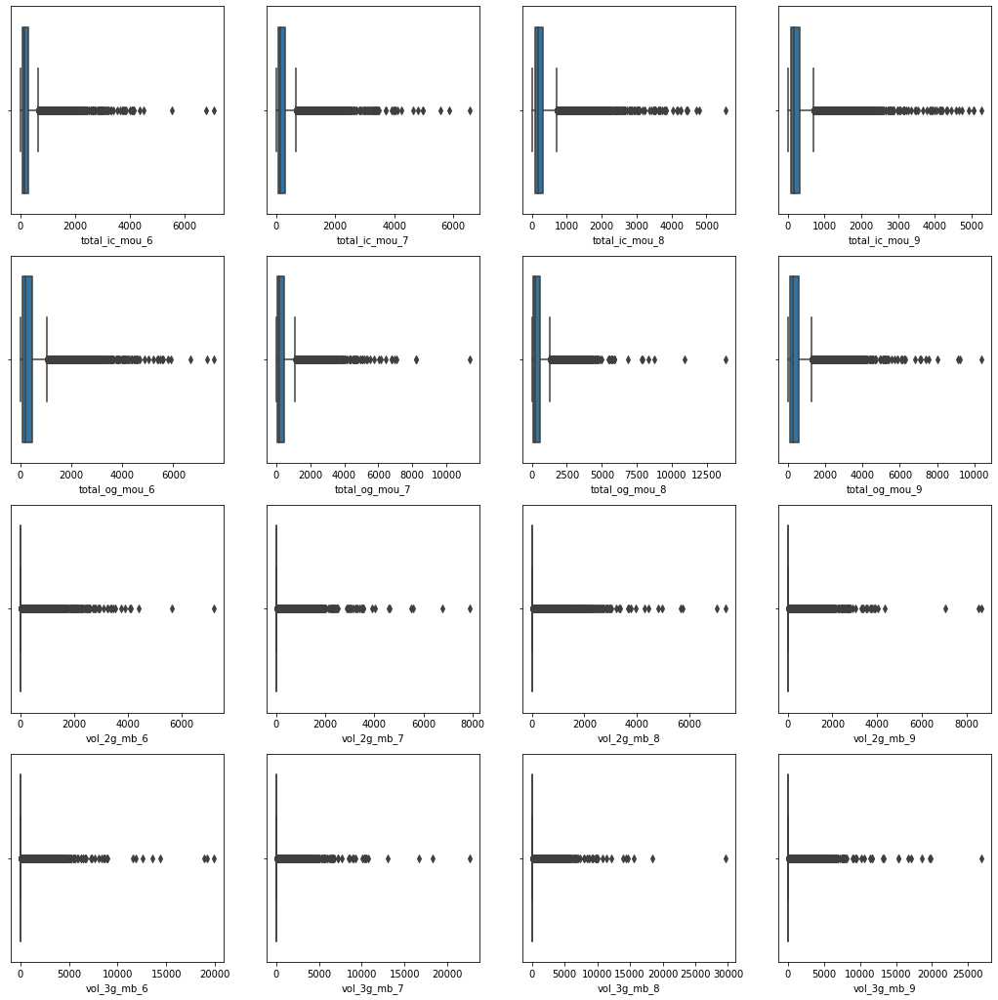

In [44]:
plt.figure(figsize=(18, 18))
plt.subplot(4,4,1)
sns.boxplot(x = 'total_ic_mou_6' ,data = rslt_tel_df)
plt.subplot(4,4,2)
sns.boxplot(x = 'total_ic_mou_7' ,data = rslt_tel_df)
plt.subplot(4,4,3)
sns.boxplot(x = 'total_ic_mou_8' ,data = rslt_tel_df)
plt.subplot(4,4,4)
sns.boxplot(x = 'total_ic_mou_9' ,data = rslt_tel_df)
plt.subplot(4,4,5)
sns.boxplot(x = 'total_og_mou_6' ,data = rslt_tel_df)
plt.subplot(4,4,6)
sns.boxplot(x = 'total_og_mou_7' ,data = rslt_tel_df)
plt.subplot(4,4,7)
sns.boxplot(x = 'total_og_mou_8' ,data = rslt_tel_df)
plt.subplot(4,4,8)
sns.boxplot(x = 'total_og_mou_9' ,data = rslt_tel_df)
plt.subplot(4,4,9)
sns.boxplot(x = 'vol_2g_mb_6' ,data = rslt_tel_df)
plt.subplot(4,4,10)
sns.boxplot(x = 'vol_2g_mb_7' ,data = rslt_tel_df)
plt.subplot(4,4,11)
sns.boxplot(x = 'vol_2g_mb_8' ,data = rslt_tel_df)
plt.subplot(4,4,12)
sns.boxplot(x = 'vol_2g_mb_9' ,data = rslt_tel_df)
plt.subplot(4,4,13)
sns.boxplot(x = 'vol_3g_mb_6' ,data = rslt_tel_df)
plt.subplot(4,4,14)
sns.boxplot(x = 'vol_3g_mb_7' ,data = rslt_tel_df)
plt.subplot(4,4,15)
sns.boxplot(x = 'vol_3g_mb_8' ,data = rslt_tel_df)
plt.subplot(4,4,16)
sns.boxplot(x = 'vol_3g_mb_9' ,data = rslt_tel_df)


### from the box plot we can see that , there are lot of outliers in columns which depicts usage based churn.

##### Below function detect the outlier using IQR (Interquartile Range Rule) method ,  but it does not remove the rows of Outlier , instead it assign 'nan' value , later below i impute nan value with mean.

In [45]:
#Outlier Treatment, this function put nan value which are outside IQR, 
# i don't want to remove outlier, instead for out outliers i want to assign 'nan' value

def outlier_detect(df):
    for i in df.columns:
        Q1=df[i].quantile(0.25)
        Q3=df[i].quantile(0.75)
        IQR=Q3 - Q1
        LTV=Q1 - 1.5 * IQR
        UTV=Q3 + 1.5 * IQR
        x=np.array(df[i])
        p=[]
        for j in x:
            if j < LTV or j>UTV:
                p.append( np.nan)
            else:
                p.append(j)
        df[i]=p
    return df

In [46]:
rslt_tel_df = outlier_detect(rslt_tel_df)

In [47]:
rslt_tel_df.shape

(29563, 173)

- fill nan with mean values

In [48]:
# fill nan values with mean
for i in rslt_tel_df.columns:
    rslt_tel_df[i]=rslt_tel_df[i].fillna(rslt_tel_df[i].mean()) 

### Identify different percentile of data on numeric attribute

In [49]:
rslt_tel_df.describe(percentiles=[.25, .5, .75, .90, .95, .99]).transpose()

,count,mean,std,min,25%,50%,75%,90%,95%,99%,max
arpu_6,29563.0,277.778041,188.623372,-120.570,133.722,247.032,375.546500,555.741400,667.890100,813.357120,868.903
arpu_7,29563.0,283.265149,194.717456,-275.799,133.197,252.860,383.751500,573.088200,687.453700,835.332200,886.717
arpu_8,29563.0,336.657561,211.312986,-197.957,172.980,301.927,450.414000,647.423000,777.535800,936.755540,999.216
arpu_9,29563.0,337.740105,213.857840,-182.030,174.563,303.325,452.894000,653.265800,775.490900,946.568480,1009.955
onnet_mou_6,29563.0,68.493768,76.279569,0.000,11.640,46.730,86.690000,180.784000,245.430000,328.380000,356.680
onnet_mou_7,29563.0,69.643869,79.178009,0.000,11.240,46.560,86.460000,186.056000,254.448000,342.197600,371.210
onnet_mou_8,29563.0,81.186287,89.180198,0.000,15.710,56.340,101.035000,212.110000,290.590000,389.587000,420.460
onnet_mou_9,29563.0,82.339657,91.507005,0.000,15.210,55.890,101.040000,215.960000,298.384000,396.793200,430.680
offnet_mou_6,29563.0,154.785926,138.029590,0.000,48.730,123.330,213.080000,364.516000,460.315000,576.347600,617.980
offnet_mou_7,29563.0,158.344696,144.326010,0.000,47.010,123.790,217.245000,381.570000,476.190000,600.180600,645.030


#### check columns who has more than 0.0 % null values

In [50]:
# check columns who has more than 0.0 % null values
print(rslt_tel_df.columns[rslt_tel_df.apply(lambda col: col.isnull().sum()/len(rslt_tel_df) > 0.0)])

Index([], dtype='object')


- non of the column has null values

In [51]:
#fraction of row last 
round ((100 * (31345 - len(rslt_tel_df.index))/31345),2)

5.69

### let us derive new feature based on telecom operator Network usage 
####   derive new feature avg_good_phase for attributes total_og_mou , total_ic_moc, vol_2g_mb, vol_3g_mb.

In [52]:
rslt_tel_df['good_phase_total_og_mou'] = (rslt_tel_df['total_og_mou_6'] +  rslt_tel_df['total_og_mou_7'])
rslt_tel_df['good_phase_total_ic_mou'] = (rslt_tel_df['total_ic_mou_6'] +  rslt_tel_df['total_ic_mou_7'])
rslt_tel_df['good_phase_vol_2g_mb'] = (rslt_tel_df['vol_2g_mb_6'] +  rslt_tel_df['vol_2g_mb_7'])
rslt_tel_df['good_phase_vol_3g_mb'] = (rslt_tel_df['vol_3g_mb_6'] +  rslt_tel_df['vol_3g_mb_7'])

### create a new column 'churn' based on 9th month data

In [53]:

rslt_tel_df['churn'] = np.where( ((rslt_tel_df.total_ic_mou_9 <=  0) &
                                  (rslt_tel_df.total_og_mou_9 <= 0) &
                                  (rslt_tel_df.vol_2g_mb_9 <= 0) &
                                  (rslt_tel_df.vol_3g_mb_9 <= 0)) ,1,0)

#### look for distribution of churn

In [54]:
rslt_tel_df['churn'].value_counts()

0    29407
1      156
Name: churn, dtype: int64

#### with above data , we can tell that the dataset is highly imbalanced

In [55]:
### Checking the Churn Rate
churn = (sum(rslt_tel_df['churn'])/len(rslt_tel_df['churn'].index))*100
churn

0.5276866353211785

### We have almost 0.5% churn rate

#### Remove 9th month columns

In [56]:
# identify all column with "_9"
l1 = rslt_tel_df.columns.to_list()
subs ="_9"
res = [i for i in l1 if subs in i] 
print(res)

['arpu_9', 'onnet_mou_9', 'offnet_mou_9', 'roam_ic_mou_9', 'roam_og_mou_9', 'loc_og_t2t_mou_9', 'loc_og_t2m_mou_9', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_9', 'loc_og_mou_9', 'std_og_t2t_mou_9', 'std_og_t2m_mou_9', 'std_og_t2f_mou_9', 'std_og_t2c_mou_9', 'std_og_mou_9', 'isd_og_mou_9', 'spl_og_mou_9', 'og_others_9', 'total_og_mou_9', 'loc_ic_t2t_mou_9', 'loc_ic_t2m_mou_9', 'loc_ic_t2f_mou_9', 'loc_ic_mou_9', 'std_ic_t2t_mou_9', 'std_ic_t2m_mou_9', 'std_ic_t2f_mou_9', 'std_ic_t2o_mou_9', 'std_ic_mou_9', 'total_ic_mou_9', 'spl_ic_mou_9', 'isd_ic_mou_9', 'ic_others_9', 'total_rech_num_9', 'total_rech_amt_9', 'max_rech_amt_9', 'last_day_rch_amt_9', 'vol_2g_mb_9', 'vol_3g_mb_9', 'monthly_2g_9', 'sachet_2g_9', 'monthly_3g_9', 'sachet_3g_9']


In [57]:
# now drop colum
rslt_tel_df = rslt_tel_df.drop(res,axis=1)
rslt_tel_df = rslt_tel_df.drop(['sep_vbc_3g'],axis=1)
col= rslt_tel_df.columns.to_list()

In [58]:
print(col)

['arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'og_others_6', 'og_others_7', 'og_others_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'lo

In [59]:
rslt_tel_df.shape

(29563, 135)

In [60]:
rslt_tel_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29563 entries, 3 to 99997
Columns: 135 entries, arpu_6 to churn
dtypes: float64(133), int32(1), int64(1)
memory usage: 30.6 MB


### Visulize the data

In [61]:
import matplotlib.pyplot as plt
import seaborn as sns

In [62]:
import scipy
from scipy.stats.stats import pearsonr

def pairplot(x_axis,y_axis) :
    sns.pairplot(rslt_tel_df,x_vars=x_axis,y_vars=y_axis,height=4,aspect=1,kind="scatter")
    plt.show()

#### check the co-relation between good phase usage based data (column which are used are good_phase_total_og_moc, good_phase_ic_mou, good_phase_vol_2g_mb, good_phase_vol_3g_mb) with churn.

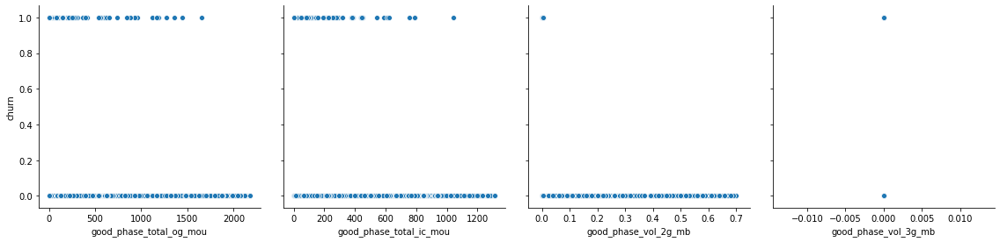

Coefficient between Price and good_phase_total_og_mou: -6.049708229324299
Coefficient  between Price and good_phase_total_ic_mou: -7.148230972316888
Coefficient  between Price and good_phase_vol_2g_mb:  -0.778568717918078
Coefficient  between Price and good_phase_vol_3g_mb:  nan


In [63]:
x_vars1 = ['good_phase_total_og_mou','good_phase_total_ic_mou','good_phase_vol_2g_mb','good_phase_vol_3g_mb']
y_vars = ['churn']
pairplot(x_vars1,y_vars)
p1=rslt_tel_df['good_phase_total_og_mou']
p2=rslt_tel_df['good_phase_total_ic_mou']
p3=rslt_tel_df['good_phase_vol_2g_mb']
p4=rslt_tel_df['good_phase_vol_3g_mb']

pearson_coeff,p_value = pearsonr(p1,rslt_tel_df['churn'])
print('Coefficient between Price and good_phase_total_og_mou:',pearson_coeff*100)

pearson_coeff,p_value = pearsonr(p2,rslt_tel_df['churn'])
print('Coefficient  between Price and good_phase_total_ic_mou:',pearson_coeff*100)

pearson_coeff,p_value = pearsonr(p3,rslt_tel_df['churn'])
print('Coefficient  between Price and good_phase_vol_2g_mb: ',pearson_coeff*100)

pearson_coeff,p_value = pearsonr(p4,rslt_tel_df['churn'])
print('Coefficient  between Price and good_phase_vol_3g_mb: ',pearson_coeff*100)

#### check the co-relation between action phase usage based data (column which are used are total_og_moc_8, total_ic_mou_8, vol_2g_mb_8,vol_3g_mb_9) with churn.

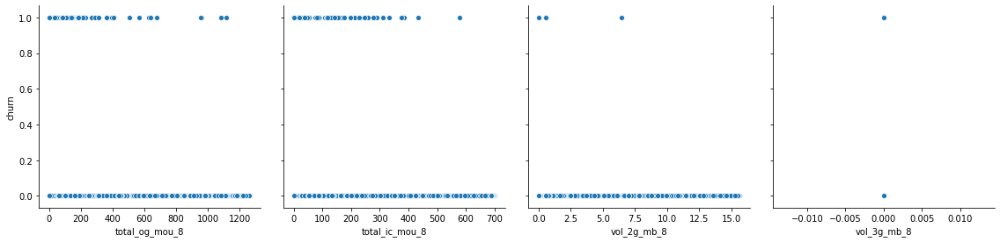

Coefficient between Price and total_og_mou_8: -5.852895759210579
Coefficient  between Price and total_ic_mou_8: -7.146201002245274
Coefficient  between Price and vol_2g_mb_8:  -1.6169002893373758
Coefficient  between Price and vol_3g_mb_8:  nan


In [64]:
x_vars1 = ['total_og_mou_8','total_ic_mou_8','vol_2g_mb_8','vol_3g_mb_8']
y_vars = ['churn']
pairplot(x_vars1,y_vars)
p1=rslt_tel_df['total_og_mou_8']
p2=rslt_tel_df['total_ic_mou_8']
p3=rslt_tel_df['vol_2g_mb_8']
p4=rslt_tel_df['vol_3g_mb_8']

pearson_coeff,p_value = pearsonr(p1,rslt_tel_df['churn'])
print('Coefficient between Price and total_og_mou_8:',pearson_coeff*100)

pearson_coeff,p_value = pearsonr(p2,rslt_tel_df['churn'])
print('Coefficient  between Price and total_ic_mou_8:',pearson_coeff*100)

pearson_coeff,p_value = pearsonr(p3,rslt_tel_df['churn'])
print('Coefficient  between Price and vol_2g_mb_8: ',pearson_coeff*100)

pearson_coeff,p_value = pearsonr(p4,rslt_tel_df['churn'])
print('Coefficient  between Price and vol_3g_mb_8: ',pearson_coeff*100)

### Correlation Matrix

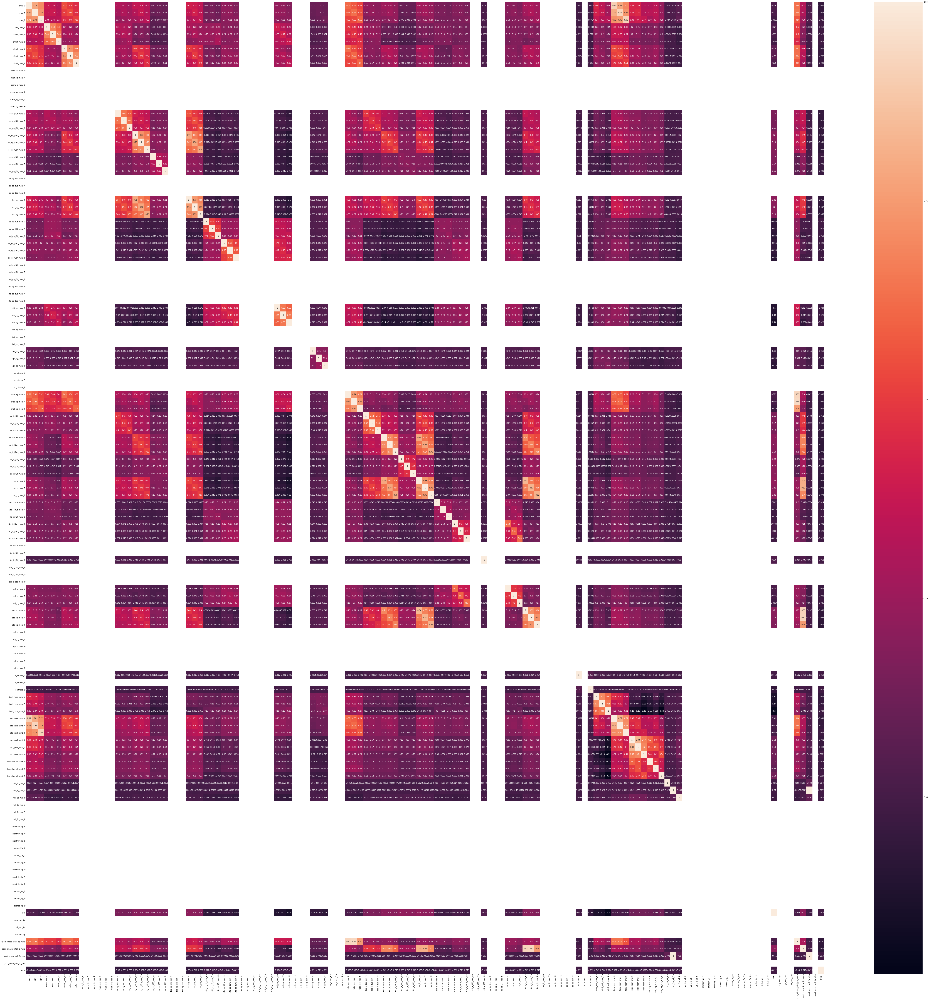

In [65]:
# Let's see the correlation matrix 
plt.figure(figsize = (100,100))        # Size of the figure
sns.heatmap(rslt_tel_df.corr(),annot = True)

# 2. Preparing the Data for Modelling (creating dummy variables , train-test-split ,rescaling etc)

## 2a. Converting Categorical variables to Numeric Variables 
### There is no categorical variables

##  2b : Splitting the Data into Training and Testing Sets

In [66]:
from sklearn.model_selection import train_test_split

# Putting feature variable to X
X = rslt_tel_df.drop(['churn'],axis=1)

# Putting response variable to y
y = rslt_tel_df['churn']

# We specify this so that the train and test data set always have the same rows, respectively
np.random.seed(0)
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7,test_size=0.3,random_state=100)
col= X.columns.to_list()
col1 = ['churn']

##  2c. Rescaling the Features

In [67]:
from sklearn.preprocessing import StandardScaler 
scaler = StandardScaler()

In [68]:
# Apply scaler() to all the columns of numeric variables
num_vars = X_train.columns
X_train[num_vars] = scaler.fit_transform(X_train[num_vars])
X_train.head(5)

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,...,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,good_phase_total_og_mou,good_phase_total_ic_mou,good_phase_vol_2g_mb,good_phase_vol_3g_mb
20734,-0.139072,-0.834780,-0.520237,-0.801674,-0.859504,-0.779596,-0.354548,-1.008447,-0.507781,0.0,...,0.0,0.0,-1.064625,0.0,0.0,0.0,-0.895718,-1.251699,-0.000354,0.0
91760,1.006951,1.476653,1.081955,0.006042,0.006921,0.000426,-0.278553,0.056688,0.026798,0.0,...,0.0,0.0,0.179922,0.0,0.0,0.0,2.801369,-0.623062,-0.116160,0.0
51954,-1.121048,-0.773109,-0.673854,-0.895671,-0.855076,-0.661910,-1.104396,-0.385268,-0.446739,0.0,...,0.0,0.0,-0.926796,0.0,0.0,0.0,-0.938864,-1.082783,-0.111472,0.0
65092,-1.209898,-1.162495,-0.984996,-0.872106,-0.763732,-0.493994,-1.106504,-0.926786,-0.863243,0.0,...,0.0,0.0,-0.213147,0.0,0.0,0.0,-1.087760,-0.885338,-0.000354,0.0
1039,0.049084,0.097195,0.116620,-0.744538,-0.861148,-0.753866,0.360828,0.520638,0.017981,0.0,...,0.0,0.0,0.599535,0.0,0.0,0.0,-0.204369,-0.773444,-0.116160,0.0


In [69]:
X_train.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
arpu_6,20694.0,-6.783981e-17,1.000024,-1.653101,-0.765889,-0.168028,0.523029,3.128977
arpu_7,20694.0,3.889321e-16,1.000024,-1.698291,-0.771546,-0.161401,0.510750,3.084260
arpu_8,20694.0,1.327289e-17,1.000024,-1.950605,-0.778282,-0.163287,0.538228,3.135662
onnet_mou_6,20694.0,-1.236943e-16,1.000024,-0.895671,-0.744406,-0.285610,0.229796,3.797483
onnet_mou_7,20694.0,-8.550659e-17,1.000024,-0.874179,-0.734823,-0.291957,0.193735,3.822190
onnet_mou_8,20694.0,2.690952e-16,1.000024,-0.907798,-0.732052,-0.272717,0.214529,3.795849
offnet_mou_6,20694.0,4.433515e-16,1.000024,-1.119522,-0.769033,-0.227719,0.421988,3.373598
offnet_mou_7,20694.0,2.086000e-16,1.000024,-1.095104,-0.772257,-0.241164,0.410912,3.378089
offnet_mou_8,20694.0,2.237185e-17,1.000024,-1.149092,-0.766532,-0.237594,0.435194,3.356361
roam_ic_mou_6,20694.0,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


##  2d. handle imbalnce data using  SMOTE

In [70]:
from imblearn.over_sampling import SMOTE 

In [71]:
print("Before OverSampling, counts of label '1': {}".format(sum(y_train == 1))) 
print("Before OverSampling, counts of label '0': {} \n".format(sum(y_train == 0))) 

Before OverSampling, counts of label '1': 117
Before OverSampling, counts of label '0': 20577 



In [72]:
sm = SMOTE(random_state = 2) 
X_train_res, y_train_res = sm.fit_sample(X_train, y_train.ravel()) 
print('After OverSampling, the shape of train_X: {}'.format(X_train_res.shape)) 
print('After OverSampling, the shape of train_y: {} \n'.format(y_train_res.shape)) 
  
print("After OverSampling, counts of label '1': {}".format(sum(y_train_res == 1))) 
print("After OverSampling, counts of label '0': {}".format(sum(y_train_res == 0))) 
X_train1 =  pd.DataFrame(X_train_res)
y_train1 =  pd.DataFrame(y_train_res)



After OverSampling, the shape of train_X: (41154, 134)
After OverSampling, the shape of train_y: (41154,) 

After OverSampling, counts of label '1': 20577
After OverSampling, counts of label '0': 20577


In [73]:
X_train1.columns = col
y_train1.columns = col1

In [74]:
print(X_train1.head())

     arpu_6    arpu_7    arpu_8  onnet_mou_6  onnet_mou_7  onnet_mou_8  \
0 -0.139072 -0.834780 -0.520237    -0.801674    -0.859504    -0.779596   
1  1.006951  1.476653  1.081955     0.006042     0.006921     0.000426   
2 -1.121048 -0.773109 -0.673854    -0.895671    -0.855076    -0.661910   
3 -1.209898 -1.162495 -0.984996    -0.872106    -0.763732    -0.493994   
4  0.049084  0.097195  0.116620    -0.744538    -0.861148    -0.753866   

   offnet_mou_6  offnet_mou_7  offnet_mou_8  roam_ic_mou_6  ...  sachet_3g_7  \
0     -0.354548     -1.008447     -0.507781            0.0  ...          0.0   
1     -0.278553      0.056688      0.026798            0.0  ...          0.0   
2     -1.104396     -0.385268     -0.446739            0.0  ...          0.0   
3     -1.106504     -0.926786     -0.863243            0.0  ...          0.0   
4      0.360828      0.520638      0.017981            0.0  ...          0.0   

   sachet_3g_8       aon  aug_vbc_3g  jul_vbc_3g  jun_vbc_3g  \
0         

# 3. Training the Model

### Perform PCA on the data

#### Note - 
- While computng the principal components, we must not include the entire dataset. Model building is all about doing well on the data we haven't seen yet!
- So we'll calculate the PCs using the train data, and apply them later on the test data

In [75]:
X_train1.shape

(41154, 134)

In [76]:
from sklearn.decomposition import PCA
pca = PCA(svd_solver='randomized', random_state=42)

In [77]:
#Doing the PCA on the train data
pca.fit(X_train1)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=42,
    svd_solver='randomized', tol=0.0, whiten=False)

In [78]:
pca.components_

array([[ 1.55209176e-01,  1.62570985e-01,  1.34356362e-01, ...,
         1.72257920e-01,  9.15529249e-03, -0.00000000e+00],
       [ 1.04063907e-01,  1.21409854e-01,  1.49292527e-01, ...,
        -1.54629265e-01, -3.30220294e-03,  0.00000000e+00],
       [ 1.50626776e-01,  1.71876707e-01,  1.54560712e-01, ...,
        -7.25952184e-02,  8.70952051e-03, -0.00000000e+00],
       ...,
       [-0.00000000e+00,  3.75488323e-32, -1.35191862e-34, ...,
        -2.20382647e-23, -3.94576381e-23, -0.00000000e+00],
       [-0.00000000e+00,  3.17501928e-42, -7.55522450e-42, ...,
         4.58044877e-33,  1.40465061e-32, -0.00000000e+00],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  1.00000000e+00]])

In [79]:
pca.explained_variance_ratio_

array([3.33764830e-01, 8.34563545e-02, 5.65353304e-02, 3.45871221e-02,
       2.55593781e-02, 2.37512370e-02, 2.22071358e-02, 1.69463168e-02,
       1.59181468e-02, 1.54478588e-02, 1.49393650e-02, 1.46604886e-02,
       1.36177862e-02, 1.28468480e-02, 1.20272925e-02, 1.12290389e-02,
       1.11399991e-02, 1.05478454e-02, 1.02542567e-02, 9.59544321e-03,
       9.25314585e-03, 9.00186319e-03, 8.60396171e-03, 8.24582757e-03,
       8.13981821e-03, 7.86201029e-03, 7.78421093e-03, 7.76223345e-03,
       7.47860655e-03, 7.31436181e-03, 6.99226564e-03, 6.89604587e-03,
       6.65696950e-03, 6.45771940e-03, 6.36000122e-03, 6.28170180e-03,
       6.02364632e-03, 5.78112792e-03, 5.64666532e-03, 5.50012931e-03,
       5.16784332e-03, 4.94821702e-03, 4.90758263e-03, 4.75534656e-03,
       4.68966060e-03, 4.43384455e-03, 4.22686034e-03, 4.01287028e-03,
       3.95032032e-03, 3.84218244e-03, 3.72287001e-03, 3.48344285e-03,
       3.23666037e-03, 3.20512729e-03, 3.12639193e-03, 3.03239849e-03,
      

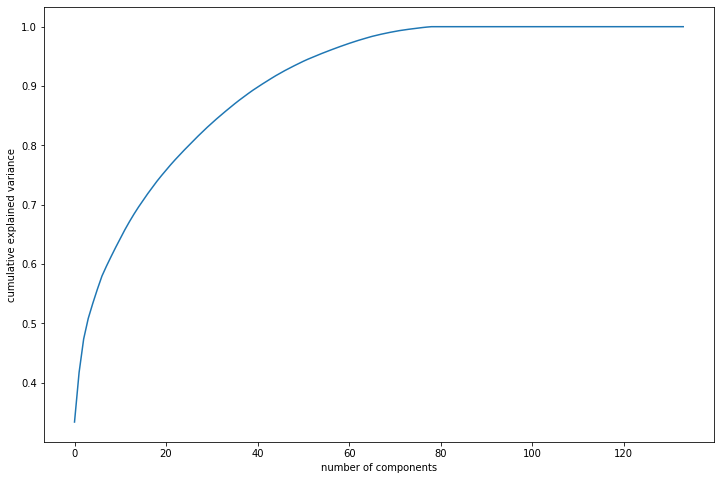

In [80]:
%matplotlib inline
fig = plt.figure(figsize = (12,8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

#### Looks like 80 components are enough to describe 100% of the variance in the dataset
- We'll choose 80 components for our modeling

In [81]:
from sklearn.decomposition import IncrementalPCA
pca_final = IncrementalPCA(n_components=80)

#### Basis transformation - getting the data onto our PCs

In [82]:
df_train_pca = pca_final.fit_transform(X_train1)
df_train_pca.shape

(41154, 80)

#### Creating correlation matrix for the principal components - we expect little to no correlation

In [83]:
#creating correlation matrix for the principal components
corrmat = np.corrcoef(df_train_pca.transpose())

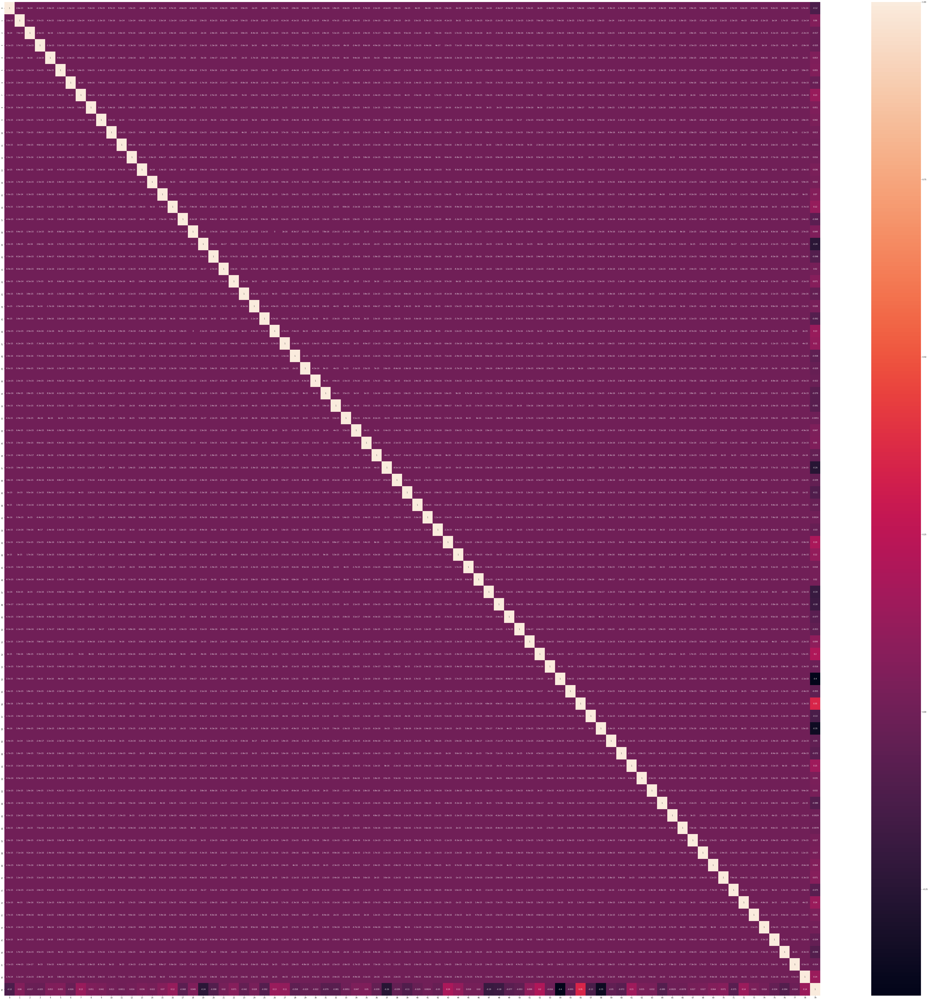

In [84]:
#plotting the correlation matrix
%matplotlib inline
plt.figure(figsize = (100,100))
sns.heatmap(corrmat,annot = True)

In [85]:
# 1s -> 0s in diagonals
corrmat_nodiag = corrmat - np.diagflat(corrmat.diagonal())
print("max corr:",corrmat_nodiag.max(), ", min corr: ", corrmat_nodiag.min(),)
# we see that correlations are indeed very close to 0

max corr: 0.34957171140913523 , min corr:  -0.3998007000949032


#### Indeed - there is no correlation between any two components! Good job, PCA!
- We effectively have removed multicollinearity from our situation, and our models will be much more stable

#### Applying a learning algoritham on our Principal Components

### Building model using Logistic Regression, SVM and Random Forest and then Evaluate the model

### 1.  Logistic Regression Model

In [86]:
#Training the model on the train data
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

learner_pca = LogisticRegression()
model_pca = learner_pca.fit(df_train_pca,y_train1)

### Apply on train data set

In [87]:
#Making prediction on the test data
pred_probs_train = model_pca.predict_proba(df_train_pca)[:,1]
print(pred_probs_train)

[3.96640944e-11 1.35379324e-08 1.94569406e-03 ... 9.98386813e-01
 9.30068749e-01 9.45584894e-01]


### Model Evaluation

In [88]:
# Converting pred_probs_test to a dataframe which is an array
y_pred_probs_train = pd.DataFrame(pred_probs_train)

In [89]:
y_pred_probs_train.head()

,0
0,3.966409e-11
1,1.353793e-08
2,1.945694e-03
3,1.364216e-02
4,1.026481e-03


In [90]:
# Converting y_test to dataframe
y_train_df = pd.DataFrame(y_train1)

In [91]:
# Removing index for both dataframes to append them side by side 
y_pred_probs_train.reset_index(drop=True, inplace=True)
y_train_df.reset_index(drop=True, inplace=True)

In [92]:
# Appending y_test_df and y_pred_prob_test
y_pred_final_train = pd.concat([y_train_df, y_pred_probs_train],axis=1)

In [93]:
y_pred_final_train.head()

,churn,0
0,0,3.966409e-11
1,0,1.353793e-08
2,0,1.945694e-03
3,0,1.364216e-02
4,0,1.026481e-03


In [94]:
y_pred_final_train = y_pred_final_train.rename(columns={ 0 : 'Churn_Prob'})

In [95]:
y_pred_final_train['final_predicted'] = y_pred_final_train.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)

In [96]:
y_pred_final_train.head()

,churn,Churn_Prob,final_predicted
0,0,3.966409e-11,0
1,0,1.353793e-08,0
2,0,1.945694e-03,0
3,0,1.364216e-02,0
4,0,1.026481e-03,0


In [97]:
# Let's check the overall accuracy.
from sklearn.metrics import confusion_matrix
from sklearn import metrics
metrics.accuracy_score(y_pred_final_train.churn, y_pred_final_train.final_predicted)

0.9418525538222287

In [98]:
confusion = metrics.confusion_matrix(y_pred_final_train.churn, y_pred_final_train.final_predicted )
confusion

array([[18778,  1799],
       [  594, 19983]], dtype=int64)

## Metrics beyond simply accuracy

In [99]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives
tot = TP+TN+FP+FN

##### sensitivity TP / float(TP+FN)

In [100]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.9711328181950721

##### Specificity  TN / float(TN+FP)

In [101]:
# Let us calculate specificity
TN / float(TN+FP)

0.9125722894493853

##### Precision
TP / TP + FP

In [102]:
TP/float(TP+FP)

0.917408869708934

##### Recall
TP / TP + FN

In [103]:
TP/float(TP+FN)

0.9711328181950721

### Plotting the ROC Curve

An ROC curve demonstrates several things:

- It shows the tradeoff between sensitivity and specificity (any increase in sensitivity will be accompanied by a decrease in specificity).
- The closer the curve follows the left-hand border and then the top border of the ROC space, the more accurate the test.
- The closer the curve comes to the 45-degree diagonal of the ROC space, the less accurate the test.

In [104]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [105]:
fpr, tpr, thresholds = metrics.roc_curve( y_pred_final_train.churn, y_pred_final_train.Churn_Prob, drop_intermediate = False )

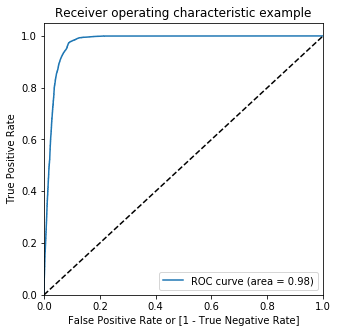

In [106]:
draw_roc(y_pred_final_train.churn, y_pred_final_train.Churn_Prob)

### Step 10: Finding Optimal Cutoff Point

Optimal cutoff probability is that prob where we get balanced sensitivity and specificity

In [107]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_pred_final_train[i]= y_pred_final_train.Churn_Prob.map(lambda x: 1 if x > i else 0)
y_pred_final_train.head()

,churn,Churn_Prob,final_predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,3.966409e-11,0,1,0,0,0,0,0,0,0,0,0
1,0,1.353793e-08,0,1,0,0,0,0,0,0,0,0,0
2,0,1.945694e-03,0,1,0,0,0,0,0,0,0,0,0
3,0,1.364216e-02,0,1,0,0,0,0,0,0,0,0,0
4,0,1.026481e-03,0,1,0,0,0,0,0,0,0,0,0


In [108]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
#num = [0.0,0.1,0.2,0.3,0.4]
for i in num:
    cm1 = metrics.confusion_matrix(y_pred_final_train.churn, y_pred_final_train[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.500000  1.000000  0.000000
0.1   0.1  0.902488  0.998591  0.806386
0.2   0.2  0.921952  0.995432  0.848472
0.3   0.3  0.933299  0.992856  0.873743
0.4   0.4  0.939010  0.983380  0.894640
0.5   0.5  0.941853  0.971133  0.912572
0.6   0.6  0.933032  0.937892  0.928172
0.7   0.7  0.924795  0.907470  0.942120
0.8   0.8  0.902270  0.848180  0.956359
0.9   0.9  0.829810  0.688439  0.971181


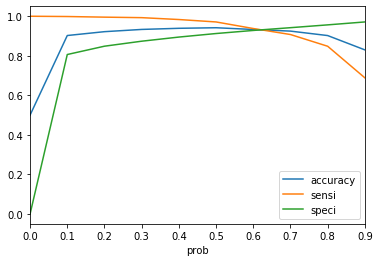

In [109]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

From the curve above, 0.05 is the optimum point to take it as a cutoff probability

In [110]:
y_pred_final_train['final_predicted'] = y_pred_final_train.Churn_Prob.map( lambda x: 1 if x > 0.65 else 0)

y_pred_final_train.head()

,churn,Churn_Prob,final_predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,3.966409e-11,0,1,0,0,0,0,0,0,0,0,0
1,0,1.353793e-08,0,1,0,0,0,0,0,0,0,0,0
2,0,1.945694e-03,0,1,0,0,0,0,0,0,0,0,0
3,0,1.364216e-02,0,1,0,0,0,0,0,0,0,0,0
4,0,1.026481e-03,0,1,0,0,0,0,0,0,0,0,0


In [111]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_pred_final_train.churn, y_pred_final_train.final_predicted)

0.9300675511493415

In [112]:
confusion2 = metrics.confusion_matrix(y_pred_final_train.churn, y_pred_final_train.final_predicted )
confusion2

array([[19238,  1339],
       [ 1539, 19038]], dtype=int64)

In [113]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [114]:
# Let's see the sensitivity of our logistic regression model i..e  true positive rate
TP / float(TP+FN)

0.925207756232687

In [115]:
# Let us calculate specificity
TN / float(TN+FP)

0.934927346065996

In [116]:
# Calculate false postive rate - predicting churn when customer does not have churned
print(FP/ float(TN+FP))

0.06507265393400398


In [117]:
# Positive predictive value 
print (TP / float(TP+FP))

0.9342886587819601


In [118]:
# Negative predictive value
print (TN / float(TN+ FN))

0.9259277085238485


## Precision and Recall

In [119]:
#Looking at the confusion matrix again

##### Precision
TP / TP + FP

In [120]:
confusion2[1,1]/(confusion2[0,1]+confusion2[1,1])

0.9342886587819601

##### Recall
TP / TP + FN

In [121]:
confusion2[1,1]/(confusion2[1,0]+confusion2[1,1])

0.925207756232687

Using sklearn utilities for the same

In [122]:
from sklearn.metrics import precision_score, recall_score

In [123]:
precision_score(y_pred_final_train.churn, y_pred_final_train.final_predicted)

0.9342886587819601

In [124]:
recall_score(y_pred_final_train.churn, y_pred_final_train.final_predicted)

0.925207756232687

### Precision and recall tradeoff

In [125]:
from sklearn.metrics import precision_recall_curve

In [126]:
p, r, thresholds = precision_recall_curve(y_pred_final_train.churn, y_pred_final_train.Churn_Prob)


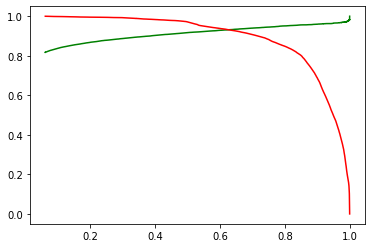

In [127]:
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

### Making predictions on the test set


In [128]:
# Apply rescaling
num_vars = X_test.columns
X_test[num_vars] = scaler.transform(X_test[num_vars])

In [129]:
#Applying selected components to the test data - 80 components
df_test_pca = pca_final.transform(X_test)
df_test_pca.shape

(8869, 80)

In [130]:
#Making prediction on the test data
pred_probs_test = model_pca.predict_proba(df_test_pca)[:,1]
print(pred_probs_test)

[2.78297128e-04 1.58302830e-07 6.98779632e-06 ... 2.03265693e-07
 3.01958582e-01 3.44830120e-04]


### Model Evaluation on Test data

In [131]:
# Converting pred_probs_test to a dataframe which is an array
y_pred_prob_test = pd.DataFrame(pred_probs_test)

In [132]:
y_pred_prob_test.head()

,0
0,2.782971e-04
1,1.583028e-07
2,6.987796e-06
3,2.004803e-03
4,9.313172e-04


In [133]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

In [134]:
# Removing index for both dataframes to append them side by side 
y_pred_prob_test.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

In [135]:
# Appending y_test_df and y_pred_prob_test
y_pred_final = pd.concat([y_test_df, y_pred_prob_test],axis=1)

In [136]:
y_pred_final.head()

,churn,0
0,0,2.782971e-04
1,0,1.583028e-07
2,0,6.987796e-06
3,0,2.004803e-03
4,0,9.313172e-04


In [137]:
y_pred_final= y_pred_final.rename(columns={ 0 : 'Churn_Prob'})

In [138]:
y_pred_final['final_predicted'] = y_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.65 else 0)

In [139]:
y_pred_final.head()

,churn,Churn_Prob,final_predicted
0,0,2.782971e-04,0
1,0,1.583028e-07,0
2,0,6.987796e-06,0
3,0,2.004803e-03,0
4,0,9.313172e-04,0


In [140]:
# Let's check the overall accuracy on test data
metrics.accuracy_score(y_pred_final.churn, y_pred_final.final_predicted)

0.9327996391926936

In [141]:
confusion_test = metrics.confusion_matrix(y_pred_final.churn, y_pred_final.final_predicted )
confusion_test

array([[8243,  587],
       [   9,   30]], dtype=int64)

In [142]:
TP_test = confusion_test[1,1] # true positive 
TN_test = confusion_test[0,0] # true negatives
FP_test = confusion_test[0,1] # false positives
FN_test = confusion_test[1,0] # false negatives
tot_test = TP_test+TN_test+FP_test+FN_test

### Model evalution of Logistic regression based on Churn rate

- Accuracy: which defines how often is the classifier is correct

In [143]:
Acc= (TN_test+TP_test)/tot_test
print(Acc)

0.9327996391926936


- Misclassification(error rate) : which defines , how often is the classifier is wrong(1-Accuracy)

In [144]:
err = (FP_test + FN_test)/tot_test
print(err)

0.06720036080730635


- True Positive Rate (Sensitivity or Recall):  when it is actually yes, how often does it predict yes

In [145]:
TP_test / float(TP_test+FN_test)

0.7692307692307693

### 2.  Support Vector Machine Model

In [146]:
from sklearn.svm import SVC
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import scale

# creating a KFold object with 2 splits 
folds = KFold(n_splits = 2, shuffle = True, random_state = 101)

# specify range of hyperparameters
# Set the parameters by cross-validation
hyper_params = [ {'gamma': [1e-2, 1e-3, 1e-4],
                     'C': [1, 10, 100, 1000]}]


# specify model
model = SVC(kernel="rbf")

# set up GridSearchCV()
model_cv = GridSearchCV(estimator = model, 
                        param_grid = hyper_params, 
                        scoring= 'accuracy', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)      

# fit the model
model_cv.fit(df_train_pca,y_train1)              

Fitting 2 folds for each of 12 candidates, totalling 24 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:  9.4min finished


GridSearchCV(cv=KFold(n_splits=2, random_state=101, shuffle=True),
             error_score='raise-deprecating',
             estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='auto_deprecated', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='warn', n_jobs=None,
             param_grid=[{'C': [1, 10, 100, 1000],
                          'gamma': [0.01, 0.001, 0.0001]}],
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='accuracy', verbose=1)

In [147]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_gamma,params,split0_test_score,split1_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,mean_train_score,std_train_score
0,6.205986,0.065030,3.871429,0.079643,1,0.01,"{'C': 1, 'gamma': 0.01}",0.987851,0.989551,0.988701,0.000850,5,0.990232,0.989503,0.989867,0.000364
1,18.476053,0.185535,11.764329,0.023326,1,0.001,"{'C': 1, 'gamma': 0.001}",0.950624,0.948438,0.949531,0.001093,10,0.951742,0.950381,0.951062,0.000680
2,28.817810,0.179996,18.847019,0.075797,1,0.0001,"{'C': 1, 'gamma': 0.0001}",0.889683,0.888516,0.889099,0.000583,12,0.889197,0.889585,0.889391,0.000194
3,3.132115,0.147223,1.685295,0.031694,10,0.01,"{'C': 10, 'gamma': 0.01}",0.994217,0.995189,0.994703,0.000486,3,0.996890,0.996209,0.996550,0.000340
4,10.368215,0.060509,5.903485,0.060759,10,0.001,"{'C': 10, 'gamma': 0.001}",0.975895,0.976867,0.976381,0.000486,8,0.979103,0.978374,0.978738,0.000364
5,19.149541,0.072336,12.637580,0.043658,10,0.0001,"{'C': 10, 'gamma': 0.0001}",0.926277,0.921757,0.924017,0.002260,11,0.923701,0.925937,0.924819,0.001118
6,2.870507,0.020231,1.108142,0.014745,100,0.01,"{'C': 100, 'gamma': 0.01}",0.995432,0.996501,0.995966,0.000535,1,0.999077,0.998688,0.998882,0.000194
7,5.835503,0.179710,2.784870,0.030965,100,0.001,"{'C': 100, 'gamma': 0.001}",0.987656,0.988191,0.987923,0.000267,6,0.991009,0.990426,0.990718,0.000292
8,15.834084,0.749373,8.945401,0.191675,100,0.0001,"{'C': 100, 'gamma': 0.0001}",0.955679,0.951013,0.953346,0.002333,9,0.957185,0.954221,0.955703,0.001482
9,3.010507,0.243012,0.815233,0.001769,1000,0.01,"{'C': 1000, 'gamma': 0.01}",0.995335,0.996064,0.995699,0.000364,2,0.999806,0.999854,0.999830,0.000024


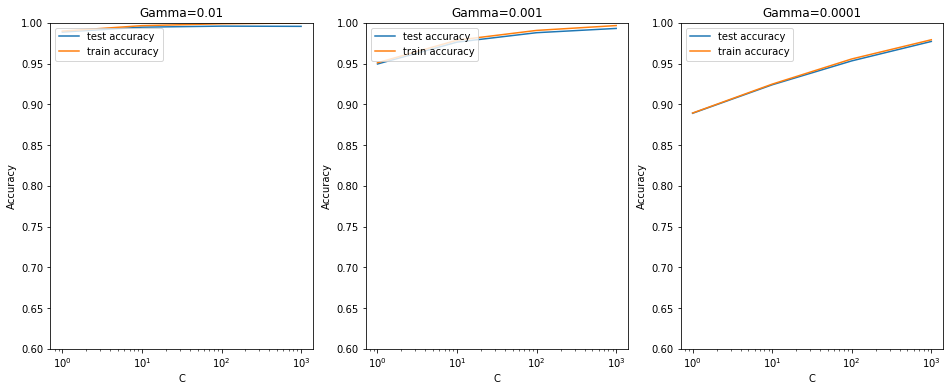

In [148]:
# converting C to numeric type for plotting on x-axis
cv_results['param_C'] = cv_results['param_C'].astype('int')

# # plotting
plt.figure(figsize=(16,6))

# subplot 1/3
plt.subplot(131)
gamma_01 = cv_results[cv_results['param_gamma']==0.01]

plt.plot(gamma_01["param_C"], gamma_01["mean_test_score"])
plt.plot(gamma_01["param_C"], gamma_01["mean_train_score"])
plt.xlabel('C')
plt.ylabel('Accuracy')
plt.title("Gamma=0.01")
plt.ylim([0.60, 1])
plt.legend(['test accuracy', 'train accuracy'], loc='upper left')
plt.xscale('log')

# subplot 2/3
plt.subplot(132)
gamma_001 = cv_results[cv_results['param_gamma']==0.001]

plt.plot(gamma_001["param_C"], gamma_001["mean_test_score"])
plt.plot(gamma_001["param_C"], gamma_001["mean_train_score"])
plt.xlabel('C')
plt.ylabel('Accuracy')
plt.title("Gamma=0.001")
plt.ylim([0.60, 1])
plt.legend(['test accuracy', 'train accuracy'], loc='upper left')
plt.xscale('log')


# subplot 3/3
plt.subplot(133)
gamma_0001 = cv_results[cv_results['param_gamma']==0.0001]

plt.plot(gamma_0001["param_C"], gamma_0001["mean_test_score"])
plt.plot(gamma_0001["param_C"], gamma_0001["mean_train_score"])
plt.xlabel('C')
plt.ylabel('Accuracy')
plt.title("Gamma=0.0001")
plt.ylim([0.60, 1])
plt.legend(['test accuracy', 'train accuracy'], loc='upper left')
plt.xscale('log')


In [149]:
# printing the optimal accuracy score and hyperparameters
best_score = model_cv.best_score_
best_hyperparams = model_cv.best_params_

print("The best test score is {0} corresponding to hyperparameters {1}".format(best_score, best_hyperparams))

The best test score is 0.9959663702191768 corresponding to hyperparameters {'C': 100, 'gamma': 0.01}


### Building and Evaluating the Final SVM Model

Let's now build and evaluate the final svm model, i.e. the model with highest test accuracy.

In [150]:
# model with optimal hyperparameters

# model
model = SVC(C=100, gamma=0.01, kernel="rbf")

model.fit(df_train_pca, y_train1)
y_pred = model.predict(df_test_pca)

# metrics
print("accuracy", metrics.accuracy_score(y_test, y_pred), "\n")
confusion_sv = metrics.confusion_matrix(y_test, y_pred)
print(confusion_sv)

accuracy 0.9925583493065735 

[[8785   45]
 [  21   18]]


In [151]:
TP_sv = confusion_sv[1,1] # true positive 
TN_sv = confusion_sv[0,0] # true negatives
FP_sv = confusion_sv[0,1] # false positives
FN_sv= confusion_sv[1,0] # false negatives
tot_sv = TP_sv+TN_sv+FP_sv+FN_sv

### Model evalution of SVM  based on Churn rate

- Accuracy: which defines how often is the classifier is correct

In [152]:
Acc= (TN_sv+TP_sv)/tot_sv
print(Acc)

0.9925583493065735


- Misclassification(error rate) : which defines , how often is the classifier is wrong(1-Accuracy)

In [153]:
err = (FP_sv + FN_sv)/tot_sv
print(err)

0.007441650693426542


- True Positive Rate (Sensitivity or Recall):  when it is actually yes, how often does it predict yes

In [154]:
TP_sv / float(TP_sv+FN_sv)

0.46153846153846156

### 3.  Random Forest Model

##### Let's first fit a random forest model with default hyperparameters.

In [155]:
# Importing random forest classifier from sklearn library
from sklearn.ensemble import RandomForestClassifier

# Running the random forest with default parameters.
rfc = RandomForestClassifier()

In [156]:
# fit
rfc.fit(df_train_pca,y_train1)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [157]:
# Making predictions
predictions = rfc.predict(df_test_pca)

In [158]:
print("accuracy", metrics.accuracy_score(y_test, predictions), "\n")
confusion_rf = metrics.confusion_matrix(y_test, predictions)
print(confusion_rf)

accuracy 0.991881835607171 

[[8790   40]
 [  32    7]]


In [159]:
# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score
print(accuracy_score(y_test,predictions))

0.991881835607171


In [160]:
TP_rf = confusion_rf[1,1] # true positive 
TN_rf = confusion_rf[0,0] # true negatives
FP_rf = confusion_rf[0,1] # false positives
FN_rf= confusion_rf[1,0] # false negatives
tot_rf = TP_rf+TN_rf+FP_rf+FN_rf

### Model evalution based on Churn

- Accuracy: which defines how often is the classifier is correct

In [161]:
Acc= (TN_rf+TP_rf)/tot_rf
print(Acc)

0.991881835607171


- Misclassification(error rate) : which defines , how often is the classifier is wrong(1-Accuracy)

In [162]:
err = (FP_rf + FN_rf)/tot_rf
print(err)

0.008118164392828954


- True Positive Rate (Sensitivity or Recall):  when it is actually yes, how often does it predict yes

In [163]:
TP_rf / float(TP_rf+FN_rf)

0.1794871794871795

### Even though accuracy is good , but Sensitivity is very low,  let's now look at the list of hyperparameters which we can tune to improve model performance.

### Tuning max_depth

In [164]:
# GridSearchCV to find optimal n_estimators
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 2

# parameters to build the model on
parameters = {'max_depth': range(2, 20, 5)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy",
                  verbose = 1,
                 return_train_score=True)
rf.fit(df_train_pca,y_train1)

Fitting 2 folds for each of 4 candidates, totalling 8 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    7.7s finished


GridSearchCV(cv=2, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                              warm_start=False),
             iid

In [165]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,mean_train_score,std_train_score
0,0.310003,0.004873,0.023450,0.007825,2,{'max_depth': 2},0.878122,0.885255,0.881688,0.003566,4,0.881221,0.890223,0.885722,0.004501
1,0.822906,0.006479,0.031240,0.000004,7,{'max_depth': 7},0.978132,0.979782,0.978957,0.000825,3,0.982844,0.982700,0.982772,0.000072
2,1.154132,0.000175,0.031245,0.000001,12,{'max_depth': 12},0.992419,0.991835,0.992127,0.000292,2,0.993779,0.993537,0.993658,0.000121
3,1.390859,0.009552,0.031228,0.000012,17,{'max_depth': 17},0.993683,0.993779,0.993731,0.000048,1,0.995675,0.995043,0.995359,0.000316


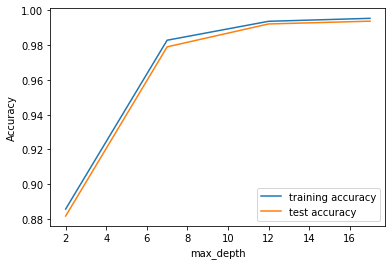

In [166]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


###### You can see that as we increase the value of max_depth, both train and test scores increase till a point, but after that test score remains constant. The ensemble tries to overfit as we increase the max_depth.

###### Thus, controlling the depth of the constituent trees will help reduce overfitting in the forest. the optimal depth is 12

### Tuning n_estimators

In [167]:
# GridSearchCV to find optimal n_estimators
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 2

# parameters to build the model on
parameters = {'n_estimators': range(100, 1500, 400)}

# instantiate the model (note we are specifying a max_depth)
rf = RandomForestClassifier(max_depth=4)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy",
                  verbose = 1,
                 return_train_score=True)
rf.fit(df_train_pca,y_train1)

Fitting 2 folds for each of 4 candidates, totalling 8 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:  5.3min finished


GridSearchCV(cv=2, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True, class_weight=None,
                                              criterion='gini', max_depth=4,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                              warm_start=False),
             iid='w

In [168]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,params,split0_test_score,split1_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,mean_train_score,std_train_score
0,5.372299,0.143925,0.148405,0.007840,100,{'n_estimators': 100},0.933521,0.940853,0.937187,0.003666,4,0.939590,0.943192,0.941391,0.001801
1,26.422465,0.056573,0.842565,0.117718,500,{'n_estimators': 500},0.938235,0.947706,0.942970,0.004736,1,0.944158,0.950190,0.947174,0.003016
2,47.666838,0.092577,1.336789,0.038967,900,{'n_estimators': 900},0.938284,0.944644,0.941464,0.003180,2,0.944547,0.947274,0.945910,0.001363
3,70.002079,1.291889,1.883737,0.010386,1300,{'n_estimators': 1300},0.936486,0.940756,0.938621,0.002135,3,0.942895,0.943483,0.943189,0.000294


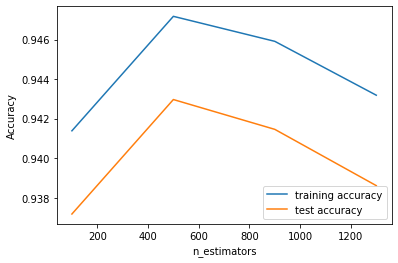

In [169]:
# plotting accuracies with n_estimators
plt.figure()
plt.plot(scores["param_n_estimators"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_n_estimators"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("n_estimators")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

### Tuning max_features

Let's see how the model performance varies with ```max_features```, which is the maximum numbre of features considered for splitting at a node.

In [170]:
# GridSearchCV to find optimal max_features
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 2

# parameters to build the model on
parameters = {'max_features': [4, 8, 14, 20, 24]}

# instantiate the model
rf = RandomForestClassifier(max_depth=4)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy",
                  verbose = 1,
                 return_train_score=True)
rf.fit(df_train_pca,y_train1)

Fitting 2 folds for each of 5 candidates, totalling 10 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   10.5s finished


GridSearchCV(cv=2, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True, class_weight=None,
                                              criterion='gini', max_depth=4,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                              warm_start=False),
             iid='w

In [171]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,params,split0_test_score,split1_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,mean_train_score,std_train_score
0,0.346259,0.051885,0.025130,0.009511,4,{'max_features': 4},0.914520,0.914706,0.914613,0.000093,3,0.918303,0.918214,0.918258,0.000045
1,0.547942,0.014067,0.023434,0.007815,8,{'max_features': 8},0.920789,0.928120,0.924454,0.003665,2,0.925107,0.929293,0.927200,0.002093
2,1.021325,0.099792,0.023433,0.007812,14,{'max_features': 14},0.923025,0.927294,0.925159,0.002135,1,0.929724,0.928467,0.929096,0.000628
3,1.484494,0.058033,0.031244,0.000001,20,{'max_features': 20},0.902857,0.914220,0.908539,0.005682,5,0.908194,0.915589,0.911892,0.003698
4,1.632979,0.068973,0.023419,0.007801,24,{'max_features': 24},0.911896,0.913491,0.912694,0.000798,4,0.917234,0.913937,0.915585,0.001648


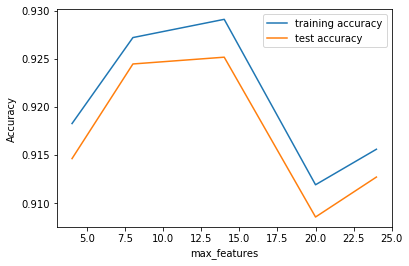

In [172]:
# plotting accuracies with max_features
plt.figure()
plt.plot(scores["param_max_features"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_features"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_features")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


##### Apparently, the training and test scores *both* seem to increase as we increase max_features, and the model doesn't seem to overfit more with increasing max_features. Think about why that might be the case.

### Tuning min_samples_leaf

In [173]:
# GridSearchCV to find optimal min_samples_leaf
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 2

# parameters to build the model on
parameters = {'min_samples_leaf': range(100, 400, 50)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy",
                  verbose = 1,
                 return_train_score=True)
rf.fit(df_train_pca,y_train1)

Fitting 2 folds for each of 6 candidates, totalling 12 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  12 out of  12 | elapsed:   13.9s finished


GridSearchCV(cv=2, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                              warm_start=False),
             iid

In [174]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,mean_train_score,std_train_score
0,1.281555,0.094479,0.031257,1.311302e-05,100,{'min_samples_leaf': 100},0.966469,0.966514,0.966492,0.000023,1,0.970354,0.972495,0.971424,0.001071
1,1.278464,0.002857,0.025944,5.297542e-03,150,{'min_samples_leaf': 150},0.955827,0.953344,0.954585,0.001241,2,0.963064,0.959423,0.961243,0.001821
2,1.196869,0.022513,0.029147,1.245618e-03,200,{'min_samples_leaf': 200},0.945719,0.949650,0.947684,0.001966,3,0.951497,0.951890,0.951694,0.000197
3,1.038187,0.086089,0.031244,2.384186e-07,250,{'min_samples_leaf': 250},0.936826,0.926371,0.931598,0.005228,4,0.938764,0.932161,0.935462,0.003302
4,0.944498,0.007274,0.015620,2.145767e-06,300,{'min_samples_leaf': 300},0.926038,0.929189,0.927613,0.001576,5,0.931036,0.930363,0.930699,0.000337


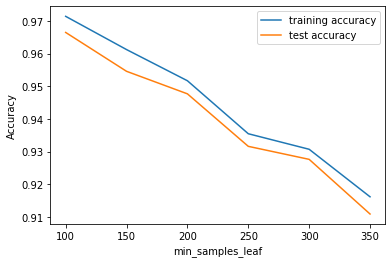

In [175]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

##### You can see that the model starts of overfit as you decrease the value of min_samples_leaf. 

### Tuning min_samples_split
Let's now look at the performance of the ensemble as we vary min_samples_split.

In [176]:
# GridSearchCV to find optimal min_samples_split
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 2

# parameters to build the model on
parameters = {'min_samples_split': range(200, 500, 50)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy",
                  verbose = 1,
                 return_train_score=True)
rf.fit(df_train_pca,y_train1)


Fitting 2 folds for each of 6 candidates, totalling 12 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  12 out of  12 | elapsed:   26.9s finished


GridSearchCV(cv=2, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                              warm_start=False),
             iid

In [177]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,mean_train_score,std_train_score
0,2.150708,0.058944,0.039055,0.007811,200,{'min_samples_split': 200},0.984109,0.986684,0.985396,0.001287,1,0.988919,0.990475,0.989697,0.000778
1,2.254049,0.130275,0.031254,0.000016,250,{'min_samples_split': 250},0.980659,0.981629,0.981144,0.000485,2,0.985226,0.987851,0.986538,0.001313
2,2.467986,0.266046,0.033259,0.013574,300,{'min_samples_split': 300},0.972738,0.977741,0.975239,0.002502,4,0.980754,0.982311,0.981533,0.000778
3,2.068358,0.054776,0.029614,0.001623,350,{'min_samples_split': 350},0.973856,0.977061,0.975458,0.001603,3,0.980365,0.983478,0.981921,0.001556
4,2.043523,0.049225,0.034523,0.003280,400,{'min_samples_split': 400},0.963699,0.967729,0.965714,0.002015,6,0.970743,0.973758,0.972250,0.001508


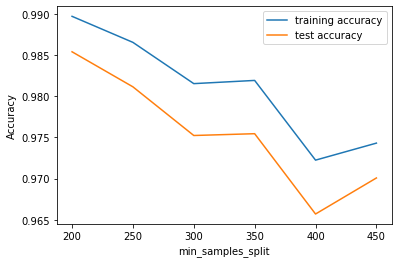

In [178]:
# plotting accuracies with min_samples_split
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

## Grid Search to Find Optimal Hyperparameters
We can now find the optimal hyperparameters using GridSearchCV.

In [179]:
# Create the parameter grid based on the results of random search 
param_grid = {
    'max_depth': [8,12],
    'min_samples_leaf': range(200, 500, 300),
    'min_samples_split': range(100, 350, 250),
    'n_estimators': range(200,1200,1000), 
    'max_features': [20,24]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 2, n_jobs = -1,verbose = 1)

In [180]:
# Fit the grid search to the data
grid_search.fit(df_train_pca,y_train1)

Fitting 2 folds for each of 4 candidates, totalling 8 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:  2.6min finished


GridSearchCV(cv=2, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                              warm_start=False),
             iid

In [181]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)

We can get accuracy of 0.9562618457501093 using {'max_depth': 12, 'max_features': 24, 'min_samples_leaf': 200, 'min_samples_split': 100, 'n_estimators': 200}


**Fitting the final model with the best parameters obtained from grid search.**

In [182]:
# model with the best hyperparameters
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(bootstrap=True,
                             max_depth=8,
                             min_samples_leaf=200, 
                             min_samples_split=100,
                             max_features=24,
                             n_estimators=200)

In [183]:
# fit
rfc.fit(df_train_pca,y_train1)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=8, max_features=24, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=200, min_samples_split=100,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [184]:
# predict
predictions = rfc.predict(df_test_pca)

In [185]:
print("accuracy", metrics.accuracy_score(y_test, predictions), "\n")
confusion_rf1 = metrics.confusion_matrix(y_test, predictions)
print(confusion_rf1)

accuracy 0.9662870673131131 

[[8546  284]
 [  15   24]]


In [186]:
TP_rf1 = confusion_rf1[1,1] # true positive 
TN_rf1 = confusion_rf1[0,0] # true negatives
FP_rf1 = confusion_rf1[0,1] # false positives
FN_rf1 = confusion_rf1[1,0] # false negatives
tot_rf1 = TP_rf1+TN_rf1+FP_rf1+FN_rf1

### Model evalution of Random Forest based on Churn rate

- Accuracy: which defines how often is the classifier is correct

In [187]:
Acc= (TN_rf1+TP_rf1)/tot_rf1
print(Acc)

0.9662870673131131


- Misclassification(error rate) : which defines , how often is the classifier is wrong(1-Accuracy)

In [188]:
err = (FP_rf1 + FN_rf1)/tot_rf1
print(err)

0.03371293268688691


- True Positive Rate (Sensitivity or Recall):  when it is actually yes, how often does it predict yes

In [189]:
TP_rf1 / float(TP_rf1+FN_rf1)

0.6153846153846154

## Evaluate models Logistic regression, SVM and Random forest

#### Logistic Regression:     Accuaray:0.932799 ,      Error-rate: 0.067200,      Sensitivity: 0.769230
#### Support Vector Machine:  Accuaray:0.99255,       Error-rate: 0.00744,       Sensitivity: 0.46153
#### Random Forest         :  Accuaray:0.9666,       Error-rate: 0.03371,       Sensitivity: 0.61538

- with the above evaluation data , I felt that Logistic regression is best suited for this problem, as 
it has better sensitivity then svm and random_forest


###  Identifying important predictor attributes which help the business understand indicators of churn using Logistic Regression

#### Looking at Correlations

In [190]:
%matplotlib inline

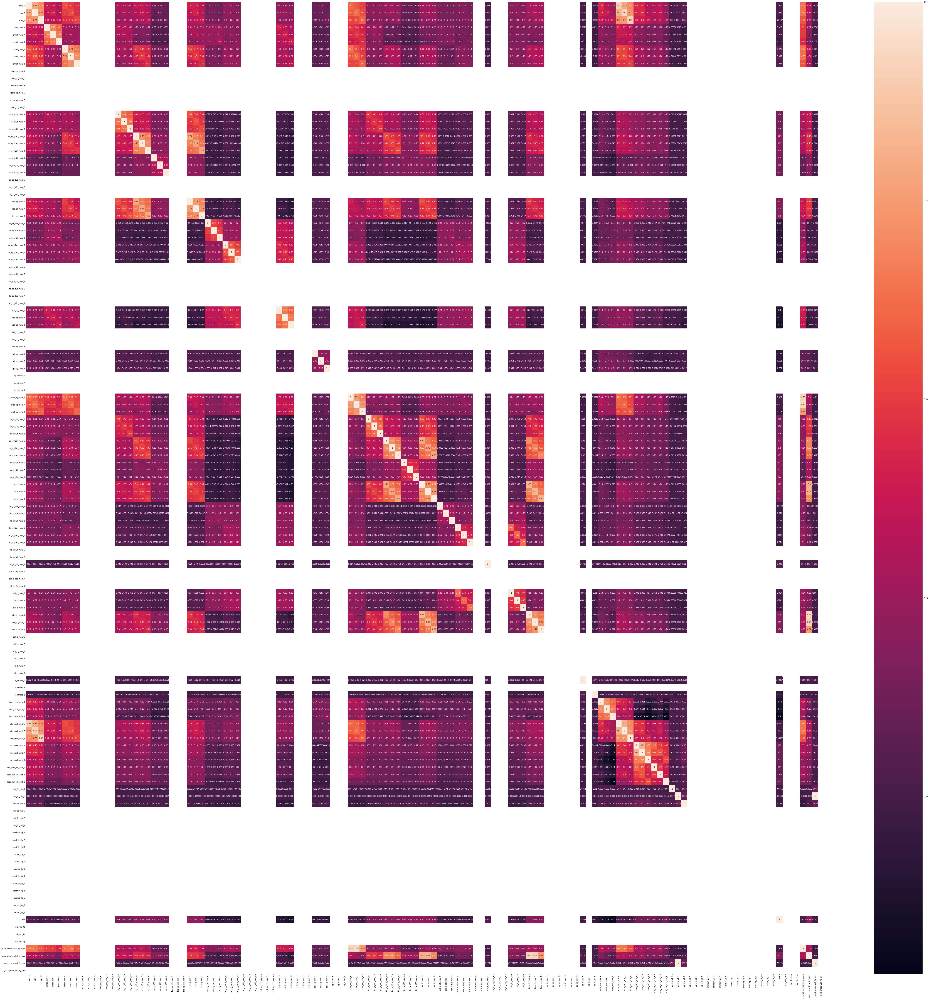

In [191]:
# Let's see the correlation matrix 
plt.figure(figsize = (100,100))        # Size of the figure
sns.heatmap(X_train.corr(),annot = True)
plt.show()

In [192]:
col = X_train.columns.to_list()
print(col)

['arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'og_others_6', 'og_others_7', 'og_others_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'lo

####  Let RFE perform dropping of highly co-related feature.

In [193]:
import statsmodels.api as sm

In [194]:
# Logistic regression model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                20694
Model:                            GLM   Df Residuals:                    20614
Model Family:                Binomial   Df Model:                           79
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Sun, 06 Oct 2019   Deviance:                          nan
Time:                        14:52:10   Pearson chi2:                 5.54e+17
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                   -1.863e+15   4.67e+05  -3.99e+09      0.000   -1.86e+15   -1.86e+15
arpu_6                   1.451e+12   1.22e+06   1.19e+06      0.000    1.45e+12    1.45e+12
arpu_7                  -5.464e+13   1.35e+06  -4.05e+07      0.000   -5.46e+13   -5.46e+13
arpu_8                       1e+13    1.3e+06   7.72e+06      0.000       1e+13       1e+13
onnet_mou_6              4.529e+13   7.24e+05   6.26e+07      0.000    4.53e+13    4.53e+13
onnet_mou_7              5.095e+12   7.57e+05   6.73e+06      0.000     5.1e+12     5.1e+12
onnet_mou_8             -3.333e+12   6.99e+05  -4.77e+06      0.000   -3.33e+12   -3.33e+12
offnet_mou_6            -8.796e+12   8.17e+05  -1.08e+07      0.000    -8.8e+12    -8.8e+12
offnet_mou_7             1.424e+14    8.6e+05   1.66e+08      0.000    1.42e+14    1.42e+14
offnet_mou_8             1.498e+14   8.16e+05   1.83e+08      0.000     1.5e+14     1.5e+14
roam_ic_mou_6              -0.0485   1.04e-09  -4.67e+07      0.000      -0.048      -0.048
roam_ic_mou_7              -0.0384   1.05e-09  -3.66e+07      0.000      -0.038      -0.038
roam_ic_mou_8               0.0551   8.76e-10   6.29e+07      0.000       0.055       0.055
roam_og_mou_6              -0.1720   1.45e-09  -1.18e+08      0.000      -0.172      -0.172
roam_og_mou_7              -0.0121   1.02e-09  -1.18e+07      0.000      -0.012      -0.012
roam_og_mou_8              -0.0396   9.81e-10  -4.04e+07      0.000      -0.040      -0.040
loc_og_t2t_mou_6        -7.477e+13   6.96e+05  -1.07e+08      0.000   -7.48e+13   -7.48e+13
loc_og_t2t_mou_7         4.671e+13   7.18e+05    6.5e+07      0.000    4.67e+13    4.67e+13
loc_og_t2t_mou_8         4.467e+12   6.95e+05   6.42e+06      0.000    4.47e+12    4.47e+12
loc_og_t2m_mou_6         3.764e+13   9.02e+05   4.17e+07      0.000    3.76e+13    3.76e+13
loc_og_t2m_mou_7        -8.012e+13   9.06e+05  -8.84e+07      0.000   -8.01e+13   -8.01e+13
loc_og_t2m_mou_8        -3.155e+14   8.96e+05  -3.52e+08      0.000   -3.15e+14   -3.15e+14
loc_og_t2f_mou_6        -1.044e+13   5.18e+05  -2.02e+07      0.000   -1.04e+13   -1.04e+13
loc_og_t2f_mou_7        -1.306e+12   5.22e+05   -2.5e+06      0.000   -1.31e+12   -1.31e+12
loc_og_t2f_mou_8        -3.859e+13   5.14e+05  -7.51e+07      0.000   -3.86e+13   -3.86e+13
loc_og_t2c_mou_6            0.0835   6.98e-10    1.2e+08      0.000       0.084       0.084
loc_og_t2c_mou_7           -0.0099   6.84e-10  -1.45e+07      0.000      -0.010      -0.010
loc_og_t2c_mou_8           -0.1556   8.34e-10  -1.87e+08      0.000      -0.156      -0.156
loc_og_mou_6              7.93e+13   9.71e+05   8.16e+07      0.000    7.93e+13    7.93e+13
loc_og_mou_7             4.663e+13   9.82e+05   4.75e+07      0.000    4.66e+13    4.66e+13
loc_og_mou_8            -5.137e+13   9.63e+05  

### Feature Selection using RFE (select 20 important features)

- using class_weight = 'balanced', to take care of unbalanced dataset, using X_train and y_train , which is scaled dataset.

In [195]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(class_weight = 'balanced')

In [196]:
from sklearn.feature_selection import RFE
rfe = RFE(logreg, 20)             # running RFE with 20 variables as output
rfe = rfe.fit(X_train, y_train)

In [197]:
rfe.support_

array([False, False,  True,  True,  True, False,  True,  True, False,
       False, False, False, False, False, False, False, False, False,
       False, False,  True, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False,  True, False, False, False,
       False,  True,  True, False, False, False, False, False,  True,
       False, False,  True, False, False,  True, False, False, False,
       False, False, False, False, False,  True, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False,  True, False,
        True, False,  True, False,  True, False, False,  True, False,
        True, False,  True, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,

In [198]:
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('arpu_6', False, 62),
 ('arpu_7', False, 8),
 ('arpu_8', True, 1),
 ('onnet_mou_6', True, 1),
 ('onnet_mou_7', True, 1),
 ('onnet_mou_8', False, 28),
 ('offnet_mou_6', True, 1),
 ('offnet_mou_7', True, 1),
 ('offnet_mou_8', False, 4),
 ('roam_ic_mou_6', False, 72),
 ('roam_ic_mou_7', False, 76),
 ('roam_ic_mou_8', False, 86),
 ('roam_og_mou_6', False, 85),
 ('roam_og_mou_7', False, 90),
 ('roam_og_mou_8', False, 89),
 ('loc_og_t2t_mou_6', False, 13),
 ('loc_og_t2t_mou_7', False, 33),
 ('loc_og_t2t_mou_8', False, 48),
 ('loc_og_t2m_mou_6', False, 12),
 ('loc_og_t2m_mou_7', False, 54),
 ('loc_og_t2m_mou_8', True, 1),
 ('loc_og_t2f_mou_6', False, 56),
 ('loc_og_t2f_mou_7', False, 47),
 ('loc_og_t2f_mou_8', False, 14),
 ('loc_og_t2c_mou_6', False, 111),
 ('loc_og_t2c_mou_7', False, 113),
 ('loc_og_t2c_mou_8', False, 114),
 ('loc_og_mou_6', False, 20),
 ('loc_og_mou_7', False, 19),
 ('loc_og_mou_8', False, 23),
 ('std_og_t2t_mou_6', False, 40),
 ('std_og_t2t_mou_7', False, 39),
 ('std_og_

In [199]:
col = X_train.columns[rfe.support_]
print(col)

Index(['arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'offnet_mou_6', 'offnet_mou_7',
       'loc_og_t2m_mou_8', 'spl_og_mou_8', 'total_og_mou_7', 'total_og_mou_8',
       'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_8', 'loc_ic_mou_8',
       'std_ic_t2f_mou_8', 'total_rech_num_7', 'total_rech_amt_6',
       'total_rech_amt_8', 'max_rech_amt_7', 'last_day_rch_amt_7',
       'vol_2g_mb_6', 'vol_2g_mb_8'],
      dtype='object')


In [200]:
X_train.columns[~rfe.support_]

Index(['arpu_6', 'arpu_7', 'onnet_mou_8', 'offnet_mou_8', 'roam_ic_mou_6',
       'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7',
       'roam_og_mou_8',
       ...
       'sachet_3g_7', 'sachet_3g_8', 'aon', 'aug_vbc_3g', 'jul_vbc_3g',
       'jun_vbc_3g', 'good_phase_total_og_mou', 'good_phase_total_ic_mou',
       'good_phase_vol_2g_mb', 'good_phase_vol_3g_mb'],
      dtype='object', length=114)

- Perform regression on selected feature

In [201]:
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                20694
Model:                            GLM   Df Residuals:                    20673
Model Family:                Binomial   Df Model:                           20
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -447.86
Date:                Sun, 06 Oct 2019   Deviance:                       895.73
Time:                        14:54:58   Pearson chi2:                 3.85e+05
No. Iterations:                    13                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                -10.7540      0.674    -15.949      0.000     -12.076      -9.432
arpu_8                 0.5184      0.235      2.209      0.027       0.059       0.978
onnet_mou_6            0.3785      0.159      2.387      0.017       0.068       0.689
onnet_mou_7            0.2740      0.166      1.648      0.099      -0.052       0.600
offnet_mou_6           0.0993      0.209      0.474      0.636      -0.311       0.510
offnet_mou_7           1.0276      0.225      4.560      0.000       0.586       1.469
loc_og_t2m_mou_8      -1.4703      0.480     -3.064      0.002      -2.411      -0.530
spl_og_mou_8          -0.7257      0.248     -2.921      0.003      -1.213      -0.239
total_og_mou_7        -1.8418      0.345     -5.343      0.000      -2.517      -1.166
total_og_mou_8        -0.8967      0.252     -3.560      0.000      -1.390      -0.403
loc_ic_t2m_mou_8      -1.9319      0.577     -3.346      0.001      -3.063      -0.800
loc_ic_t2f_mou_8      -1.2468      0.427     -2.923      0.003      -2.083      -0.411
loc_ic_mou_8           0.0848      0.351      0.242      0.809      -0.602       0.772
std_ic_t2f_mou_8      -2.5280      2.385     -1.060      0.289      -7.202       2.146
total_rech_num_7      -0.4257      0.164     -2.591      0.010      -0.748      -0.104
total_rech_amt_6      -0.7741      0.236     -3.286      0.001      -1.236      -0.312
total_rech_amt_8       0.4835      0.210      2.299      0.022       0.071       0.896
max_rech_amt_7        -0.6215      0.217     -2.868      0.004      -1.046      -0.197
last_day_rch_amt_7     0.5149      0.195      2.642      0.008       0.133       0.897
vol_2g_mb_6           -6.6995      6.042     -1.109      0.268     -18.542       5.143
vol_2g_mb_8           -2.4916      1.071     -2.326      0.020      -4.591      -0.392
======================================================================================
"""

In [202]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

20734    5.052168e-09
91760    2.296721e-07
51954    1.577223e-04
65092    7.253600e-04
1039     8.910126e-05
1914     1.135821e-10
47823    5.098584e-04
53297    1.325386e-07
76549    1.589322e-09
10982    8.803061e-05
dtype: float64

In [203]:
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([5.05216821e-09, 2.29672138e-07, 1.57722285e-04, 7.25360044e-04,
       8.91012602e-05, 1.13582063e-10, 5.09858365e-04, 1.32538600e-07,
       1.58932194e-09, 8.80306078e-05])

In [204]:
y_train_pred_final = pd.DataFrame({'Churn':y_train.values, 'Churn_Prob':y_train_pred})
y_train_pred_final['ID'] = y_train.index
y_train_pred_final.head()

,Churn,Churn_Prob,ID
0,0,5.052168e-09,20734
1,0,2.296721e-07,91760
2,0,1.577223e-04,51954
3,0,7.253600e-04,65092
4,0,8.910126e-05,1039


##### Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0

In [205]:
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_train_pred_final.head()

,Churn,Churn_Prob,ID,predicted
0,0,5.052168e-09,20734,0
1,0,2.296721e-07,91760,0
2,0,1.577223e-04,51954,0
3,0,7.253600e-04,65092,0
4,0,8.910126e-05,1039,0


In [206]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.9943945104861313


#### Checking VIFs

In [207]:
# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [208]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,arpu_8,7.32
15,total_rech_amt_8,6.81
7,total_og_mou_7,3.05
14,total_rech_amt_6,2.90
9,loc_ic_t2m_mou_8,2.88
11,loc_ic_mou_8,2.80
4,offnet_mou_7,2.63
8,total_og_mou_8,2.59
3,offnet_mou_6,2.41
2,onnet_mou_7,2.04


##### as arpu_8 has high VIF, remove this attribute 



In [209]:
col = col.drop('arpu_8')
col

Index(['onnet_mou_6', 'onnet_mou_7', 'offnet_mou_6', 'offnet_mou_7',
       'loc_og_t2m_mou_8', 'spl_og_mou_8', 'total_og_mou_7', 'total_og_mou_8',
       'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_8', 'loc_ic_mou_8',
       'std_ic_t2f_mou_8', 'total_rech_num_7', 'total_rech_amt_6',
       'total_rech_amt_8', 'max_rech_amt_7', 'last_day_rch_amt_7',
       'vol_2g_mb_6', 'vol_2g_mb_8'],
      dtype='object')

In [210]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                20694
Model:                            GLM   Df Residuals:                    20674
Model Family:                Binomial   Df Model:                           19
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -450.29
Date:                Sun, 06 Oct 2019   Deviance:                       900.57
Time:                        14:55:00   Pearson chi2:                 3.21e+05
No. Iterations:                    13                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                -10.7722      0.679    -15.874      0.000     -12.102      -9.442
onnet_mou_6            0.3748      0.160      2.349      0.019       0.062       0.688
onnet_mou_7            0.2710      0.168      1.612      0.107      -0.058       0.600
offnet_mou_6           0.1124      0.211      0.534      0.593      -0.300       0.525
offnet_mou_7           1.0343      0.227      4.558      0.000       0.590       1.479
loc_og_t2m_mou_8      -1.4768      0.483     -3.056      0.002      -2.424      -0.530
spl_og_mou_8          -0.7012      0.247     -2.839      0.005      -1.185      -0.217
total_og_mou_7        -1.8985      0.344     -5.519      0.000      -2.573      -1.224
total_og_mou_8        -0.8122      0.244     -3.324      0.001      -1.291      -0.333
loc_ic_t2m_mou_8      -1.9270      0.580     -3.320      0.001      -3.065      -0.789
loc_ic_t2f_mou_8      -1.2651      0.424     -2.981      0.003      -2.097      -0.433
loc_ic_mou_8           0.0510      0.354      0.144      0.886      -0.643       0.745
std_ic_t2f_mou_8      -2.7110      2.419     -1.121      0.262      -7.453       2.031
total_rech_num_7      -0.3861      0.163     -2.368      0.018      -0.706      -0.067
total_rech_amt_6      -0.6577      0.230     -2.856      0.004      -1.109      -0.206
total_rech_amt_8       0.8444      0.121      6.991      0.000       0.608       1.081
max_rech_amt_7        -0.6460      0.216     -2.994      0.003      -1.069      -0.223
last_day_rch_amt_7     0.5430      0.194      2.796      0.005       0.162       0.924
vol_2g_mb_6           -7.5549      5.989     -1.261      0.207     -19.293       4.183
vol_2g_mb_8           -2.2286      1.028     -2.169      0.030      -4.243      -0.214
======================================================================================
"""

In [211]:
y_train_pred = res.predict(X_train_sm).values.reshape(-1)

In [212]:
y_train_pred[:10]

array([1.67860825e-08, 2.56575276e-07, 1.59485054e-04, 7.63278315e-04,
       7.32033479e-05, 9.35858348e-11, 4.70507109e-04, 1.31830094e-07,
       1.49835040e-09, 8.56370185e-05])

In [213]:
y_train_pred_final['Churn_Prob'] = y_train_pred

In [214]:
# Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,ID,predicted
0,0,1.678608e-08,20734,0
1,0,2.565753e-07,91760,0
2,0,1.594851e-04,51954,0
3,0,7.632783e-04,65092,0
4,0,7.320335e-05,1039,0


In [215]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.9943461873006668


##### So overall the accuracy hasn't dropped much.

##### Let's check the VIFs again

In [216]:
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
6,total_og_mou_7,3.05
8,loc_ic_t2m_mou_8,2.88
13,total_rech_amt_6,2.81
10,loc_ic_mou_8,2.80
3,offnet_mou_7,2.63
7,total_og_mou_8,2.55
2,offnet_mou_6,2.41
14,total_rech_amt_8,2.36
1,onnet_mou_7,2.04
0,onnet_mou_6,1.99


#### All variables have a good value of VIF (less then 5). So we need not drop any more variables and we can proceed with making predictions using this model only

##### Important predictors for telecom churn are.
-  total_og_mou_7

-  loc_ic_t2m_mou_8

-  total_rech_amt_6

-  loc_ic_mou_8

-  offnet_mou_7

-  total_og_mou_8

-  offnet_mou_6

-  total_rech_amt_8

-  onnet_mou_7

-  onnet_mou_6

-  max_rech_amt_7

-  loc_og_t2m_mou_8

-  last_day_rch_amt_7

-  total_rech_num_7

-  loc_ic_t2f_mou_8

-  spl_og_mou_8

-  vol_2g_mb_8

-  std_ic_t2f_mou_8

-  vol_2g_mb_6

##### when we look at this predictors , Month-7 and Month-8 outgoing and incoming  minutes of usage plays important role in predicting the telecom churn.

in month 8 , if outgoing and incoming data are reduced then operator can offer incentives to the customers


#### Draw line gragh between 'total_rech_amt_6' and 'total_rech_amt_8'  and compare

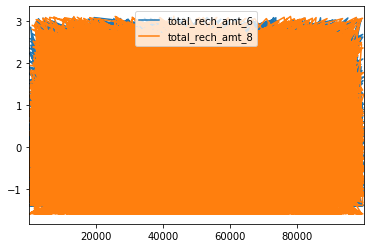

In [217]:
dummy_df = pd.DataFrame()
dummy_df['total_rech_amt_6'] = X_train['total_rech_amt_6']
dummy_df['total_rech_amt_8'] = X_train['total_rech_amt_8']
dummy_df.plot.line()

#### when we look at the above line graph for recharge amount, even though the line graph is overlapped , but we see that recharge amout for month 6 has more spike than month 8

#### Draw line gragh between 'vol_2g_mb_6' and 'vol_2g_mb_8'  and compare

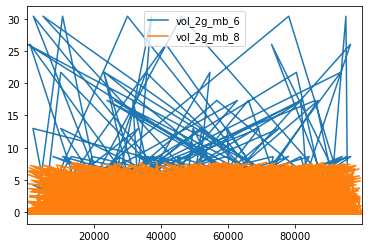

In [218]:
dummy_df = pd.DataFrame()
dummy_df['vol_2g_mb_6'] = X_train['vol_2g_mb_6']
dummy_df['vol_2g_mb_8'] = X_train['vol_2g_mb_8']
dummy_df.plot.line()

#### when we look at the above line graph for vol_2g_mb attribute, we see that vol_2g_mb for month 6 has more spike than month 8, in month 8 volume usage for 2g has reduced a lot.

#### Draw line gragh between 'loc_og_t2m_mou_6' and 'loc_ic_t2m_mou_8'  and compare

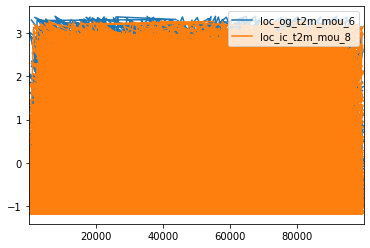

In [219]:
dummy_df = pd.DataFrame()
dummy_df['loc_og_t2m_mou_6'] = X_train['loc_og_t2m_mou_6']
dummy_df['loc_ic_t2m_mou_8'] = X_train['loc_ic_t2m_mou_8']
dummy_df.plot.line()

#### when we look at the above line graph for loc_og_t2m_mou, even though the line graph is overlapped , but we see that loc_og_t2t_mou for month 6 has more spike than month 8

##### from the  above line graph ,it is clear that in month 8 operator network usage is reduced when compared to month 6 and month 7 , so operator has to offer  incentives to the customers, to hold customers.